# FEAMP20 16S rRNA analysis - Barosa et al. 2024

## Loading required packages and setting up plot preferences and ggplot theme for the Giovannelli Lab

In [42]:
library(tidyverse)
library(ape)
#library(DECIPHER)
library(microbiome)
library(ggpubr)
library(vegan)
#library(repr)
library(ggpmisc) #to use stat_poly_eq
library(gridExtra) # gridding plots
library(viridis)
library(ggrepel)
library(phyloseq)
#library(wesanderson) #new palettes http://www.sthda.com/english/wiki/ggplot2-colors-how-to-change-colors-automatically-and-manually
#library(rioja) # plotting poackages for tabular bubbleplots
#library(reshape2) 
library(gghighlight) # manipulating abundance colors in plots to have gary grouping of low abundance taxa
library(plyr)
library(dplyr)
library(ggh4x)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ lubridate 1.9.3     ✔ tibble    3.2.1
✔ purrr     1.0.2     ✔ tidyr     1.3.1
✔ readr     2.1.5     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘ape’


The following object is masked from ‘package:ggpubr’:

    rotate


The following object is masked from ‘package:dplyr’:

    where


Loading required package: phyloseq

Registered S3 method overwritten by 'igraph':
  method   from
  plot.sir AMR 


microbiome R package (microbiome.github.com)
    


 Copyright (C) 2011-2022 Leo Lahti, 
    Sudarshan Shetty et al. <microbiome.github.io>



Attaching package: ‘microbiome’


The following object is masked from ‘package:ggplot2’:

    a

In [161]:
options(repr.plot.width=12, repr.plot.height=8)

In [3]:
set.seed(10000)

In [4]:
theme_glab <- function(base_size = 20,
                    base_family = "",
                    base_line_size = base_size / 180,
                    base_rect_size = base_size / 180) {
   
    font <- "Helvetica" #assign font family up front
   
    theme_bw(base_size = base_size,
                base_family = base_family,
                base_line_size = base_line_size) %+replace%
    theme(
        legend.background =  element_blank(),
        legend.title =       element_text(color = rgb(100, 100, 100, maxColorValue = 255),
                                          size = rel(0.65),
                                         hjust = 0),
        legend.text =        element_text(color = rgb(100, 100, 100, maxColorValue = 255),
                                          size = rel(0.65)),
        legend.key.size =    unit(0.8, "lines"),
     
      plot.title = element_text(
        color = rgb(100, 100, 100, maxColorValue = 255),
        hjust = 0),
       
      axis.title = element_text(
        color = rgb(100, 100, 100, maxColorValue = 255),
        size = rel(0.65)),
      axis.text = element_text(
        color = rgb(100, 100, 100, maxColorValue = 255),
        size = rel(0.65)),
       
      plot.caption = element_text(
        color = rgb(100, 100, 100, maxColorValue = 255),
        size = rel(0.7),
        hjust = 1),
       
      panel.grid.major = element_blank(),  
      panel.grid.minor = element_blank(),  
      panel.border = element_rect(fill = NA, colour = rgb(100, 100, 100, maxColorValue = 255)),

     
      complete = TRUE
    )
}

# Starting the microbial analysis 

In [5]:
# loading the environmental dataset
feamp20_df<-read.csv("FEAMP20_Environmental_dataset.csv",header=T, sep=",",row.names=1)
feamp20_df

,code,location,type,region,geo_chem,lat,long,depth,temp,psu,⋯,Mg,Ca,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,BC,Gulf of Naples,biofilm,Somma-Vesuvius,Cluster_3,40.68858,14.45475,0.2,26.4,17.65,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
15,BC,Gulf of Naples,fluid,Somma-Vesuvius,Cluster_3,40.68858,14.45475,0.2,26.4,17.65,⋯,606.87,460.67,0.047346,0.097862,0.193533,0.011163,0.120608,8.110929,0.000000,0.006474
A,BC,Gulf of Naples,sediment,Somma-Vesuvius,Cluster_3,40.68858,14.45475,0.2,26.4,17.65,⋯,606.87,460.67,0.047346,0.097862,0.193533,0.011163,0.120608,8.110929,0.000000,0.006474
16,CM1,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
1,CM1,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
7,CM2,Gulf of Naples,biofilm,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
13,CM2,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
11,CM2,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
17,GB,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143


In [6]:
#loading the different object from the dada2 analysis
seqtab_nochim<-readRDS("seqtab_nochim.rds")
taxa<-readRDS("taxa.rds")
tree<-read_tree("tree")

In [7]:
seqtab_nochim <- seqtab_nochim[c("blk-C","1","16","11","13","7","17","F","10","18","14","3","12","9","5","6","4","15","A"),] 

In [8]:
prok_data_raw<-phyloseq(otu_table(seqtab_nochim, taxa_are_rows = F),
                      tax_table(taxa), sample_data(feamp20_df),
                       phy_tree(tree))
prok_data_raw
message("Total number of reads")
sum(readcount(prok_data_raw))

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4881 taxa and 19 samples ]
sample_data() Sample Data:       [ 19 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4881 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4881 tips and 4879 internal nodes ]

Total number of reads



[1] 187798

In [9]:
prok_data_raw

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4881 taxa and 19 samples ]
sample_data() Sample Data:       [ 19 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4881 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4881 tips and 4879 internal nodes ]

In [10]:
# Define a function to remove negative controls
prune_negatives = function(physeq, negs, samps) {
  negs.n1 = prune_taxa(taxa_sums(negs)>=1, negs)
  samps.n1 = prune_taxa(taxa_sums(samps)>=1, samps)
  allTaxa <- names(sort(taxa_sums(physeq),TRUE))
  negtaxa <- names(sort(taxa_sums(negs.n1),TRUE))
  taxa.noneg <- allTaxa[!(allTaxa %in% negtaxa)]
  return(prune_taxa(taxa.noneg,samps.n1))
}

In [11]:
# Removing the ASV found in the negative controls from all the samples¶
blanks = subset_samples(prok_data_raw, sample_names(prok_data_raw) == "blk-C")
samples = subset_samples(prok_data_raw, sample_names(prok_data_raw) != "blk-C")
prok_data = prune_negatives(prok_data_raw,blanks,samples)

In [12]:
# Check the stats after removing the blanks
prok_data
sum(readcount(prok_data))
(sum(readcount(prok_data))/sum(readcount(prok_data_raw)))*100# check percentage of reads after blank removal

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4776 taxa and 18 samples ]
sample_data() Sample Data:       [ 18 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4776 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4776 tips and 4774 internal nodes ]

[1] 186780

[1] 99.45793

In [13]:
# Clean up unwanted sequences from Eukarya, mitochrondria and chloroplast
prok_data <- subset_taxa(prok_data,  (Kingdom != "Eukaryota") | is.na(Kingdom))
prok_data <- subset_taxa(prok_data, (Order!="Chloroplast") | is.na(Order))
prok_data <- subset_taxa(prok_data, (Family!="Mitochondria") | is.na(Family))
prok_data
sum(readcount(prok_data))
(sum(readcount(prok_data))/sum(readcount(prok_data_raw)))*100# check percentage of reads after blank removal

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4669 taxa and 18 samples ]
sample_data() Sample Data:       [ 18 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4669 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4669 tips and 4667 internal nodes ]

[1] 183314

[1] 97.61233

In [14]:
## Removing the known DNA Extraction contaminants from Sheik et al., 2018
# Assuming you are starting from a phyloseq object called prok_data_raw
prok_data_contam <- subset_taxa(prok_data,  (Genus != "Afipia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Aquabacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Asticcacaulis") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Aurantimonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Beijerinckia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Bosea") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Bradyrhizobium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Brevundimonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Caulobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Craurococcus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Devosia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Hoefleae") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Mesorhizobium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Methylobacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Novosphingobium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Ochrobactrum") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Paracoccus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Pedomicrobium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Phyllobacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Rhizobium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Sphingobium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Sphingomonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Sphingopyxis") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Acidovorax") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Azoarcus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Azospira") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Burkholderia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Comamonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Cupriavidus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Curvibacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Delftiae") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Duganella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Herbaspirillum") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Janthinobacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Kingella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Leptothrix") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Limnobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Massilia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Methylophilus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Methyloversatilis") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Oxalobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Pelomonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Polaromonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Neisseria") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Ralstonia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Schlegelella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Sulfuritalea") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Undibacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Variovorax") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Acinetobactera") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Enhydrobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Enterobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Escherichia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Nevskia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Pasteurella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Pseudoxanthomonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Psychrobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Stenotrophomonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Xanthomonas") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Aeromicrobium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Actinomyces") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Arthrobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Beutenbergia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Brevibacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Corynebacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Curtobacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Dietzia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Janibacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Kocuria") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Microbacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Micrococcus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Microlunatus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Patulibacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Propionibacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Rhodococcus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Tsukamurella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Chryseobacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Dyadobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Flavobacterium") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Hydrotalea") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Niastella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Parabacteroides") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Pedobacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Prevotella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Wautersiella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Deinococcus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Abiotrophia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Bacillus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Brevibacillus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Brochothrix") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Facklamia") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Olivibacter") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Lactobacillus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Paenibacillus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Ruminococcus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Staphylococcus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Streptococcus") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Veillonella") | is.na(Genus))
prok_data_contam <- subset_taxa(prok_data_contam,  (Genus != "Fusobacterium") | is.na(Genus))
prok_data_contam
message("reads saved from prok_data_raw after contaminants removal")
sum(readcount(prok_data_contam))/sum(readcount(prok_data_raw)) # reads saved from prok_data_raw after contaminants removal 
message("reads saved from prok_data_prune_mit after Eukaryota, Chloroplast, and Mitochondria removal")
sum(readcount(prok_data_contam))/sum(readcount(prok_data)) # reads saved from prok_data_prune_mit after Eukaryota, Chloroplast, and Mitochondria remova

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4658 taxa and 18 samples ]
sample_data() Sample Data:       [ 18 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4658 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4658 tips and 4656 internal nodes ]

reads saved from prok_data_raw after contaminants removal



[1] 0.9711658

reads saved from prok_data_prune_mit after Eukaryota, Chloroplast, and Mitochondria removal



[1] 0.9949213

In [15]:
# Removing the potential human pathogens and contaminants
# This step needs to be evaluated with attention since many of these genera
# might be relevant in many environmental settings. Usually it is better to compare
# before-after removal to see what and how much you are removing. Feel free to
# experiment with the different groups and evaluate the results.

prok_data_humpath <- subset_taxa(prok_data_contam, (Genus != "Abiotrophia") |  is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Achromobacter") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Acinetobacter") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Actinobacillus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Arcanobacterium") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Babesia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Bifidobacterium") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Bartonella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Bordetella") |  is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Borrelia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Brodetella") |  is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Brucella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Capnocytophaga") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Chlamydia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Citrobacter") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Comamonas") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Corynebacterium_1") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Corynebacterium") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Coxiella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Cronobacter") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Cutibacterium") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Dermatophilus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Ehrlichia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Order != "Enterobacteriales") | is.na(Order))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Enterococcus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Erysipelothrix") |  is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Escherichia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Escherichia/Shigella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Francisella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Gardnerella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Granulicatella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Haemophilus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Hafnia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Helicobacter") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Klebsiella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Kocuria") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Lactococcus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Lactobacillus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Lawsonia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Legionella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Leptospira") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Listeria") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Merkel_cell") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Micrococcus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Morganella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Mycoplasma") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Neisseria") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Nocardia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Pasteurella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Plesiomonas") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Propionibacterium") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Proteus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Providencia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Pseudomonas") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Rhodococcus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Rickettsiae") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Roseomonas") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Rothia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Salmonella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Serratia") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Shewanella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Shigella") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Sphaerophorus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Staphylococcus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Stenotrophomonas") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Streptococcus") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Treponema") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Vibrio") | is.na(Genus))
prok_data_humpath <- subset_taxa(prok_data_humpath, (Genus != "Yersinia") | is.na(Genus))
message("reads saved from prok_data_raw after contaminants removal")
sum(readcount(prok_data_humpath))/sum(readcount(prok_data_raw)) # reads saved from prok_data_raw after contaminants removal 
message("reads saved from prok_data_contam after DNA KIT EXTRAC. contaminants removal")
sum(readcount(prok_data_humpath))/sum(readcount(prok_data_contam)) # reads saved from prok_data_contam after DNA KIT EXTRAC. contaminants removal

reads saved from prok_data_raw after contaminants removal



[1] 0.952156

reads saved from prok_data_contam after DNA KIT EXTRAC. contaminants removal



[1] 0.9804258

In [16]:
# other contaminants found within the samples
prok_data_contam2 <- subset_taxa(prok_data_humpath, (Genus != "Lachnospiraceae_NK4A136_group") | is.na(Genus))
prok_data_contam2 <- subset_taxa(prok_data_contam2, (Genus != "Akkermansia") | is.na(Genus))
prok_data_contam2 <- subset_taxa(prok_data_contam2, (Genus != "Lactobacillus") | is.na(Genus))
prok_data_contam2 <- subset_taxa(prok_data_contam2, (Genus != "Lachnoclostridium") | is.na(Genus))
prok_data_contam2 <- subset_taxa(prok_data_contam2, (Family != "Lachnospiraceae") | is.na(Family))
prok_data_contam2 <- subset_taxa(prok_data_contam2, (Family != "Muribaculaceae") | is.na(Family))
message("reads saved from prok_data_raw after contaminants removal")
sum(readcount(prok_data_contam2))/sum(readcount(prok_data_raw)) # reads saved from prok_data_raw after contaminants removal 
message("reads saved from prok_data_contam after DNA KIT EXTRAC. contaminants removal")
sum(readcount(prok_data_contam2))/sum(readcount(prok_data_humpath)) # reads saved from prok_data_contam after DNA KIT EXTRAC. contaminants removal

reads saved from prok_data_raw after contaminants removal



[1] 0.9513999

reads saved from prok_data_contam after DNA KIT EXTRAC. contaminants removal



[1] 0.9992059

In [17]:
# Keeping all the ASVs and not removing singletons and low abundance ASVs
prok_data2 <- prok_data_contam2
prok_data2
sum(readcount(prok_data2))
(sum(readcount(prok_data2))/sum(readcount(prok_data_raw)))*100

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4612 taxa and 18 samples ]
sample_data() Sample Data:       [ 18 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4612 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4612 tips and 4610 internal nodes ]

[1] 178671

[1] 95.13999

In [18]:
prok_data2 = filter_taxa(prok_data2, function(x) sum(x) > 0, TRUE)
prok_data2
sum(readcount(prok_data2))
(sum(readcount(prok_data2))/sum(readcount(prok_data_raw)))*100

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4612 taxa and 18 samples ]
sample_data() Sample Data:       [ 18 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4612 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4612 tips and 4610 internal nodes ]

[1] 178671

[1] 95.13999

In [19]:
# Normalize the counts across the different samples by converting the abundance to relative abundance 
# and multiply by the median library size
readcount(prok_data2)
median(readcount(prok_data2))
mean(readcount(prok_data2))

1    16    11    13     7    17     F    10    18    14     3    12     9 
 3789  7468  2652  4392  2071 11242  6243  4741  8781 12992 20991 19055  4323 
    5     6     4    15     A 
12303 19702  7762 13086 17078

[1] 8271.5

[1] 9926.167

In [20]:
prok_ndata <- transform_sample_counts(prok_data2, function(x) ((x / sum(x))*median(readcount(prok_data2))))
prok_ndata

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4612 taxa and 18 samples ]
sample_data() Sample Data:       [ 18 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4612 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4612 tips and 4610 internal nodes ]

In [21]:
# Transform normalized abundance to relative abundances for plotting and some stats
prok_ra = transform_sample_counts(prok_ndata, function(x){x / sum(x)})
prok_ra

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4612 taxa and 18 samples ]
sample_data() Sample Data:       [ 18 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4612 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4612 tips and 4610 internal nodes ]

In [289]:
# Transform normalized abundance to relative abundances for plotting and some stats
prok_ra = transform_sample_counts(prok_ndata_no_b, function(x){x / sum(x)})
prok_ra

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4612 taxa and 13 samples ]
sample_data() Sample Data:       [ 13 samples by 31 sample variables ]
tax_table()   Taxonomy Table:    [ 4612 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4612 tips and 4610 internal nodes ]

## Barplots


In [290]:
## Agglomerate at a specific taxonomic level at the Genus level
prok_ra_genus = tax_glom(prok_ra, "Genus", NArm = FALSE)
prok_ra_family = tax_glom(prok_ra, "Family", NArm = FALSE)
prok_ra_order = tax_glom(prok_ra, "Order", NArm = FALSE)
prok_ra_class = tax_glom(prok_ra, "Class", NArm = FALSE)
prok_ra_phyla = tax_glom(prok_ra, "Phylum", NArm = FALSE)
prok_ra_kingdom = tax_glom(prok_ra, "Kingdom", NArm = FALSE)

In [4]:
#Saving a .csv with combined taxonomy and ASVs abundances for the selected taxonomic level
summary_object <-subset_samples(prok_ra_genus)
summary_otu <- as.matrix(t(otu_table(summary_object)))
summary_tax <- as.matrix(tax_table(summary_object))
summary_comb <- cbind(summary_otu, summary_tax)
write.csv(summary_comb, "summary__genus_for_asvs.csv")

In [5]:
prok_ra_genus

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 812 taxa and 13 samples ]
sample_data() Sample Data:       [ 13 samples by 31 sample variables ]
tax_table()   Taxonomy Table:    [ 812 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 812 tips and 810 internal nodes ]

In [10]:
write.csv(summary_comb, "summary__genus_for_asvs.csv")

In [11]:
summary_comb

,1,16,11,13,17,F,10,18,14,12,9,15,A,Kingdom,Phylum,Class,Order,Family,Genus
GACGGAGGGTGCAAACGTTGTTCGGAATCACTGGGCGTAAAGGGCGCGTAGGCGGACTTGTAAGTCAGGAGTGAAAACTCGGGGCTCAACCCCGAGCCTGCTTCTGAAACTGCAAGTCTTGAGGACCGGAGAGGAAAGTGGAATTCCTAGTGTAGCGGTGGAATGCGTAGATATTAGGAAGAACACCAGTGGCGAAGGCGACTTTCTGGACGGTTCCTGACGCTGAGGCGCGAAAGCTAGGGGAGCAAACAGGATTAGATACCCTGGTAGTCCTAGCCGTAAACGATGAGTGCTAGGTGGTGGTAGTTTCAACGCTTTCACTGCCGAAGCTAACGCATTAAGCACTCCGCCTGGGGAGTACGGCCGCAAGGTTG,0,0,0,0,0,0.00240269101393561,0,0,0,0,0,0,0,Bacteria,Gemmatimonadota,AKAU4049,NA,NA,NA
TACGGAGGGAGCAAGCGTTGTTCGGAATTACTGGGCGTAAAGGGCGCGTAGGCTGTTTGGTAAGTCAGATGTGAAATTCACCGGCTTAACCGGTTGAACTGCATCCGAAACTGCCAGACTTGAGATCAGTAGAGGAGAGTGGAATTCCCAGTGTAGCGGTGGAATGCGTAGATATTGGGAAGAACACCGGTGGCGAAGGCGGCTCTCTGGACTGATTCTGACGCTGAGGCGCGAAAGCTAGGGGAGCGAACAGGATTAGATACCCTGGTAGTCCTAGCCGTAAACGATGGGTACTAGGTGTTGGGGGTTTCCATGCCTCCAGTGCCGAAGCTAACGCATTAAGTACCCCGCCTGGGGAGTACGACCGCAAGGTTG,0,0,0,0,0.00151218644369329,0,0,0.000455528983031545,0,0,0,0,0,Bacteria,Gemmatimonadota,MD2902-B12,NA,NA,NA
TACGAAGGGGGCAAGCGTTGTTCGGATTTACTGGGCGTAAAGGGCGCGCAGGCGGACCGATAAGTCGTCTGTGAAATCTGCCGGCTCAACCAGCAGCCTGCAGTCGAAACTATCGGTCTTGAGTATGGGAGAGGTGAGCGGAATCTCTGGTGTAGCGGTGAAATGCGTAGATATCAGAGAGAACACCGGTGGCGAAGGCGGCTCACTGGCCTAATACTGACGCTGAGGCGCGAAAGCTAGGGGAGCGAACGGGATTAGATACCCCGGTAGTCCTAGCCGTAAACGATGGGTACTAGGTGTTGGAGGTATTGACCCCTTCAGTGCCGAAGCAAACGCATTAAGTACCCCGCCTGGGGAGTACGGTCGCAAGGCTG,0,0,0,0,0.00960683152463974,0.00176197341021945,0,0.000569411228789432,0,0.000157438992390449,0,0,0,Bacteria,PAUC34f,NA,NA,NA,NA
TACGGAGGGTGCAAGCGTTGTTCGGATTTACTGGGCGTAAAGCGCGAGCAGGCGGGTCTGTAAGTCTTGTGTGTAATCTTTCGGCTCAACCGAAAAACTGCACGGGAAACTACAGATCTTGAGTGCGAGAGAGGATGGCGGAATTCCTGGTGTAGCGGTGAAATGCGTAGATATCAGGAGGAACACCGGTGGCGAAGGCGGCCATCTGGCTCGACACTGACGCTCATTCGCGAAGGCCGGGGGAGCAAACAGGATTAGATACCCTGGTAGTCCCGGCAGTAAACGTTGGACACTAGGTGTTGGAGGTCGACCCCTTCAGTGCCGCAGCTAACGCATTAAGTGTCCCGCCTGGGGAGTACGGCCGCAAGGTTG,0.00237529691211401,0,0,0,0.00302437288738659,0.0051257408297293,0.00316388947479435,0.00204988042364195,0,0.000104959328260299,0,0,0.00234219463637428,Bacteria,Zixibacteria,NA,NA,NA,NA
TACGGAGGGAGCGAGCGTTGTTCGGATTTATTGGGCGTAAAGGGCACGTAGGCGGCTTCGAAAGTCGGATGTGAAAGCCTGCCGCTCAACGGCGGAATTGCATTCGAAACTTCGAGGCTTGAGTTCGGGGGAAGAGAGCGGAATTCTCGGTGTAGCGGTGAAATGCGTAGATATCGAGAAGAACACCAGCGGCGAAGGCGGCTCTCTATTCTGAAACTGACGCTGAGGTGCGAAAGCCAGGGGAGCGAACGGGATTAGATACCCCGGTAGTCCTGGCCGTAAACGATGTGCACTTGGTGTTGGGTCGCGAGGCTCAGTGCCGAAGTTAACGCATTAAGTGCACCGCCTGGGGAGTACGACCGCAAGGTTG,0,0,0,0,0.000889521437466643,0,0,0,0,0,0,0,0,Bacteria,Verrucomicrobiota,Chlamydiae,LD1-PA32,NA,NA
TACGGGGGGAGCGAGCGTTATTCGGATTTACTGGGCGTAAAGGGTTCGTAGGCGGTCAGATAAGTCAGGGGTGAAATCCAACGGCTCAACCGTTGAACTGCCTTTGAAACTGTCTGACTTGAGTGCAGGAGAGGAAAGCGGAATTCTCGGTGTAGCGGTGAAATGCGTGGATATCGAGAGGAACACCAGTGGCGTAGGCGGCTTTCTGGTCTGCAACTGACGCTGATGAACGAAAGCCAGGGGAGCGAACGGGATTAGATACCCCGGTAGTCCTGGCTGTAAACGATGGGCACTAGGTGTGGGAGGTATCGACTCCTTCTGTGCCGCAGTTAACGCATTAAGTGCCCCGCCTGGGGAGTACGGCCGCAAGGTTG,0,0,0.00113122171945701,0,0.000533712862479986,0.00192215281114849,0.00949166842438304,0.00455528983031545,0,0.000157438992390449,0.00231320842007865,0,0.000351329195456142,Bacteria,Latescibacterota,Latescibacteria,Latescibacterales,Latescibacteraceae,NA
TACGGAGGGTGCAAGCGTTGTTCGGATTCACTGGGTATAAAGGGTGCGCAGGCGGCCTGATAAGTCAGAGGTGAAATATGACGGCTTAACCGTCAAACTGCCTCTGAAACTGTCAGGCTTGAGTCCGGGAGAGGTAGGTGGAATTCCAGGTGTAGCGGTGAAATGCGTAAATATCTGGAGGAACACCGGTGGCGAAGGCGGCCTACTGGCCCGGAACTGACGCTCAGGCACGAAAGCATGGGGAGCGAACGGGATTAGATACCCCGGTAGTCCATGCCGTAAACGATGGGTACTAGGTGTTGGGGGAGTCTACCCCCTCAGTGCCGCAGCTAATGCATTAAGTACCCCACCTGGGGAGTACGATCGCAAGGTTG,0.0153074689891792,0.0062935190144617,0.00678733031674208,0.0011384335154827,0.00640455434975983,0.0227454749319238,0.0156085214089854,0.0148046919485252,0,0.00194174757281553,0.0111034004163775,0.00168118600030567,0.0125892961705118,Bacteria,Latescibacterota,NA,NA,NA,NA
GACGGAGGGAGCAAGCGTTGTTCGGATTTACTGGGCGTAAAGGGCGTCTAGGCGGACTGGCAAGTCAGGTGTGAAATCCCCCGGCTCAACCGGGGAATTGCACTTGAAACTGCCGATCTTGAGTACGGGAGAGGAAAGCGGAATTCCTGGTGTAGCGGTGAAATGCGTA

In [276]:
## Altering plot proportion to create the composite plot
options(repr.plot.width=12, repr.plot.height=4)

In [279]:
#function to remove less abundant taxa
merge_low_abundance <- function(pobject, threshold=0.01){
transformed <- transform_sample_counts(pobject, function(x) x/sum(x))
otu.table <- as.data.frame(t(otu_table(transformed)))
otu.list <- row.names(otu.table[rowMeans(otu.table) < threshold,])
merged <- merge_taxa(transformed, otu.list, 1)
                                       
for (i in 1:dim(tax_table(merged))[1]){
if (is.na(tax_table(merged)[i,2])){
taxa_names(merged)[i] <- "Other"
tax_table(merged)[i,1:ncol(tax_table(merged))] <- "Other"}
}
return(merged)
}

In [18]:
# create the labels for the plot and the vector to order the data doing plots
labell_s<-c("Campi Flegrei Caldera","Campi Flegrei Caldera rim","Somma-Vesuvius")

names(labell_s)<-c("Campi Flegrei Caldera", "Campi Flegrei Caldera rim", "Somma-Vesuvius")

order_sample<-c("14", "12", "9", "17", "F","18","10","16","1","13","11", "15", "A")

#sample_name<-c("BC Sediment", "BC Fluid", "CM2", "SF_EF2", "SF_G1", "SF_G2", "GB")

order_s<-c("14", "12", "9", "17", "F","18","10","16","1","13","11", "15", "A")

In [281]:
CustomPalette <- c("#543005", "#8c510a", "#bf812d", "#dfc27d", "#f6e8c3",
"#f5f5f5", "#c7eae5", "#80cdc1", "#35978f", "#01665e", "#003c30" ,"#5BB2A8", "#35978f","#1B7F77", "#01665e")

In [19]:
CustomPalette2 <- c("#F5F5F5", "#C7EAE5", "#80CDC1", "#35978F", "#01665E", "#003C30", "#5BB2A8", "#1B7F77", "#F0F8FF", "#7FFFD4", "#66CDAA", "#20B2AA", "#3CB371", "#2E8B57", "#6B8E23", "#556B2F", "#8FBC8F", "#8B4513", "#A0522D", "#A0522D", "#8B4513", "#CD853F", "#D2B48C", "#DEB887", "#F4A460", "#8B4513", "#8B4513")

In [7]:
sample_data(prok_ndata_no_b)

,code,location,type,region,lat,long,depth,temp,psu,do,⋯,Mg,Ca,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,CM1,Gulf of Naples,sediment,Campi Flegrei Caldera rim,40.77955,14.08835,7.0,26.3,27.54,55.0,⋯,1125.29,590.81,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
16,CM1,Gulf of Naples,fluid,Campi Flegrei Caldera rim,40.77955,14.08835,7.0,26.3,27.54,55.0,⋯,1125.29,590.81,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
11,CM2,Gulf of Naples,sediment,Campi Flegrei Caldera rim,40.77955,14.08835,8.3,27.0,38.37,92.0,⋯,1174.52,557.06,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
13,CM2,Gulf of Naples,fluid,Campi Flegrei Caldera rim,40.77955,14.08835,8.3,27.0,38.37,92.0,⋯,1174.52,557.06,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
17,GB,Gulf of Naples,fluid,Campi Flegrei Caldera,40.82375,14.07890,5.4,28.0,35.41,43.0,⋯,1372.12,443.86,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
F,GB,Gulf of Naples,sediment,Campi Flegrei Caldera,40.82375,14.07890,5.4,28.0,35.41,43.0,⋯,1372.12,443.86,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
10,SF_EF2,Gulf of Naples,sediment,Campi Flegrei Caldera,40.82306,14.08750,10.0,34.0,26.50,75.0,⋯,865.24,450.90,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302
18,SF_EF2,Gulf of Naples,fluid,Campi Flegrei Caldera,40.82306,14.08750,10.0,34.0,26.50,75.0,⋯,865.24,450.90,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302
14,SF_G1,Gulf of Naples,fluid,Campi Flegrei Caldera,40.82306,14.08750,13.3,71.0,34.06,50.8,⋯,1218.43,481.86,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868


## Bar plot phyla lvl

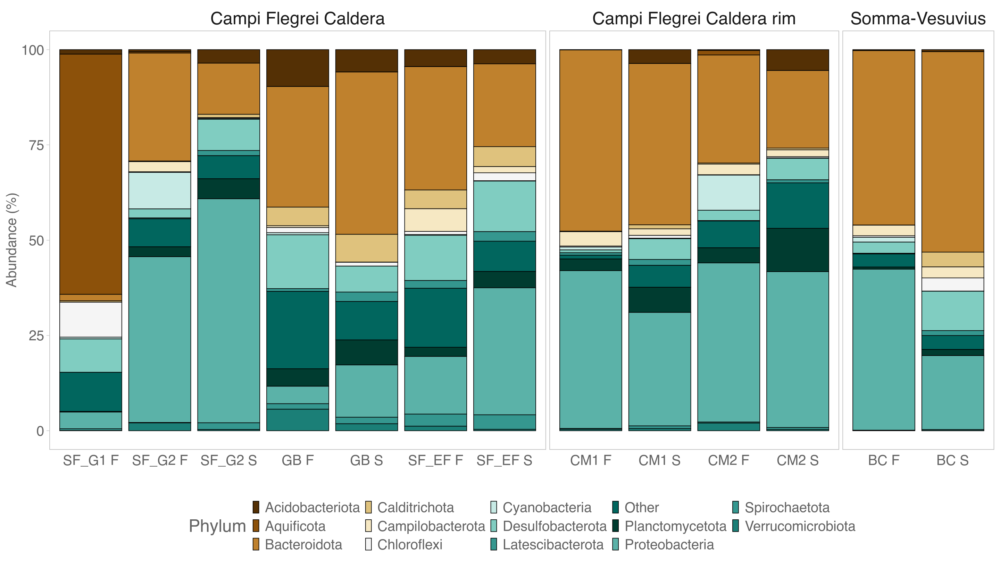

In [22]:
options(repr.plot.width=24, repr.plot.height=13.5)
p1 <- merge_low_abundance(prok_ra_phyla, 0.01) %>%
transform_sample_counts(function(x){x*100}) %>%
plot_bar(fill="Phylum")+
    facet_grid(
        ~region, scale="free",space="free",
        labeller=labeller(code=labell_s)
    )+
    theme_glab()+
    theme(
        legend.position = "bottom",
        #axis.text.x = element_text(angle = 340, vjust = 0.5, hjust=0),
        axis.text=element_text(size=24),
        axis.title=element_text(size=24),
        legend.text = element_text(size=24),
        legend.title = element_text(size=30),
        panel.spacing = unit(0.4, "lines"),
        axis.ticks.x=element_blank(),
        strip.background = element_blank(),
        strip.placement = "outside",
        strip.text=element_text(size=30),
        panel.border = element_rect(size=1, colour ="gray")
    )+
    labs(y="Abundance (%)",
         x="") +

scale_fill_manual(values = CustomPalette) +

facetted_pos_scales(x=list(
        region=="Campi Flegrei Caldera" ~ scale_x_discrete(labels=c("SF_G1 F","SF_G2 F", "SF_G2 S", "GB F", "GB S", "SF_EF F", "SF_EF S")),
       
        region=="Campi Flegrei Caldera rim" ~ scale_x_discrete(labels=c("CM1 F","CM1 S", "CM2 F", "CM2 S")),

        region=="Somma-Vesuvius" ~ scale_x_discrete(labels=c("BC F", "BC S"))))


p1$data$Sample <- factor(p1$data$Sample, levels = order_s)


p1

In [30]:
ggsave("bar_plots_phyla.svg", width=24, height=13.5)

## Bar plot order lvl

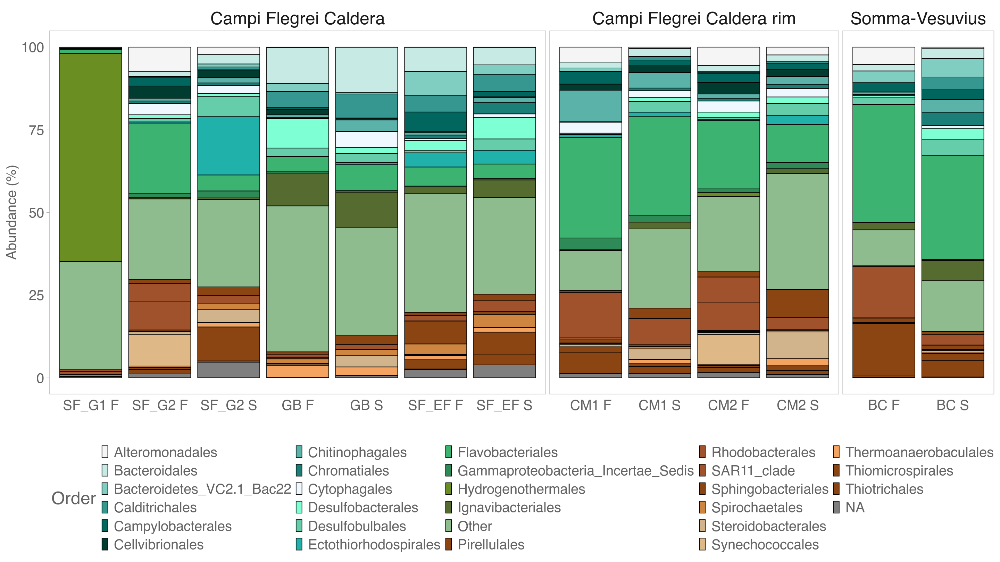

In [23]:
options(repr.plot.width=24, repr.plot.height=13.5)
p2 <- merge_low_abundance(prok_ra_order, 0.01) %>%
transform_sample_counts(function(x){x*100}) %>%
plot_bar(fill="Order")+
    facet_grid(
        ~region, scale="free",space="free",
        labeller=labeller(code=labell_s)
    )+
    theme_glab()+
    theme(
        legend.position = "bottom",
        #axis.text.x = element_text(angle = 340, vjust = 0.5, hjust=0),
        axis.text=element_text(size=24),
        axis.title=element_text(size=24),
        legend.text = element_text(size=24),
        legend.title = element_text(size=30),
        panel.spacing = unit(0.4, "lines"),
        axis.ticks.x=element_blank(),
        strip.background = element_blank(),
        strip.placement = "outside",
        strip.text=element_text(size=30),
        panel.border = element_rect(size=1, colour ="gray")
    )+
    labs(y="Abundance (%)",
         x="") +

scale_fill_manual(values = CustomPalette2) +

facetted_pos_scales(x=list(
        region=="Campi Flegrei Caldera" ~ scale_x_discrete(labels=c("SF_G1 F","SF_G2 F", "SF_G2 S", "GB F", "GB S", "SF_EF F", "SF_EF S")),
       
        region=="Campi Flegrei Caldera rim" ~ scale_x_discrete(labels=c("CM1 F","CM1 S", "CM2 F", "CM2 S")),

        region=="Somma-Vesuvius" ~ scale_x_discrete(labels=c("BC F", "BC S"))))

#p$data$code<-factor(p$data$code, levels=order_sample)

p2$data$Sample <- factor(p2$data$Sample, levels = order_s)


p2

In [28]:
ggsave("bar_plots_order.svg", width=24, height=13.5)

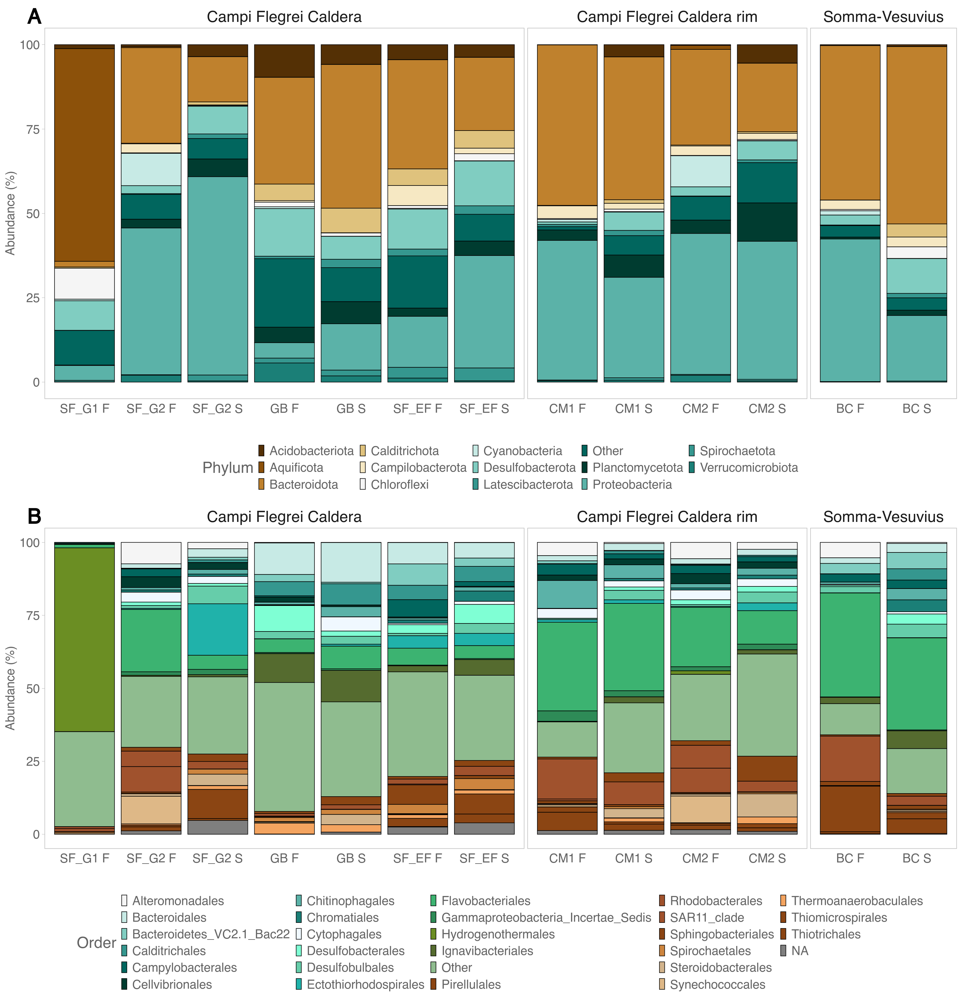

In [25]:
# Setting plots ratio
options(repr.plot.width=26, repr.plot.height=27)

ggarrange(p1,p2,
          labels=c("A", "B"), hjust=-2,
          font.label = list(size = 40),
          nrow=2,
          ncol=1,
          common.legend = FALSE,
          #widths=8,
          #heights=8,
          align="v"
          )

ggsave("bar_plots_revisited_2.svg", width=26,height=27)

## Bar Plots for Biofilms

In [27]:
prok_ndata_biofilm <- subset_samples(prok_ndata, type == "biofilm")
prok_ndata_biofilm

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4612 taxa and 5 samples ]
sample_data() Sample Data:       [ 5 samples by 31 sample variables ]
tax_table()   Taxonomy Table:    [ 4612 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4612 tips and 4610 internal nodes ]

In [28]:
# Transform normalized abundance to relative abundances for plotting and some stats
prok_ra_biofilm = transform_sample_counts(prok_ndata_biofilm, function(x){x / sum(x)})
sample_data(prok_ra_biofilm)

,code,location,type,region,lat,long,depth,temp,psu,do,⋯,Mg,Ca,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
7,CM2,Gulf of Naples,biofilm,Campi Flegrei Caldera rim,40.77955,14.08835,8.3,27.0,38.37,92.0,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
3,SF_G1,Gulf of Naples,biofilm,Campi Flegrei Caldera,40.82306,14.08750,13.3,71.0,34.06,50.8,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
5,SF_G2A,Gulf of Naples,biofilm,Campi Flegrei Caldera,40.82306,14.08750,12.9,68.9,34.50,51.8,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
6,SF_G2B,Gulf of Naples,biofilm,Campi Flegrei Caldera,40.82306,14.08750,12.9,68.9,34.50,51.8,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
4,BC,Gulf of Naples,biofilm,Somma-Vesuvius,40.68858,14.45475,0.2,26.4,17.65,53.7,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [29]:
prok_ra_phyla_biofilm = tax_glom(prok_ra_biofilm, "Phylum", NArm = FALSE)
prok_ra_order_biofilm = tax_glom(prok_ra_biofilm, "Order", NArm = FALSE)
prok_ra_genus_biofilm = tax_glom(prok_ra_biofilm, "Genus", NArm = FALSE)

In [43]:
#Saving a .csv with combined taxonomy and ASVs abundances for the selected taxonomic level
summary_object <-subset_samples(prok_ra_genus_biofilm)
summary_otu <- as.matrix(t(otu_table(summary_object)))
summary_tax <- as.matrix(tax_table(summary_object))
summary_comb <- cbind(summary_otu, summary_tax)
write.csv(summary_comb, "summary_biolfims.csv")

In [30]:
labell_s<-c("Campi Flegrei Caldera","Campi Flegrei Caldera rim","Somma-Vesuvius")
names(labell_s)<-c("Campi Flegrei Caldera", "Campi Flegrei Caldera rim", "Somma-Vesuvius")
order_sample<-c("3", "5", "6", "12", "7", "4")
sample_name<-c("SF_G1", "SF_G2A", "SF_G2B", "CM2 ", "BC ")
order_s<-c("3", "5", "6", "12", "7", "4")

In [31]:
CustomPalette <- c("#543005", "#bf812d", "#f6e8c3", "#80cdc1", 
                           "#01665e", "#003c30", "#5BB2A8", "#1B7F77")

In [32]:
CustomPalette2 <- c("#F5F5F5", "#35978F", "#01665E", "#003C30", "#5BB2A8", 
                            "#1B7F77", "#66CDAA", "#2E8B57", "#8B4513", "#CD853F", 
                            "#F4A460")

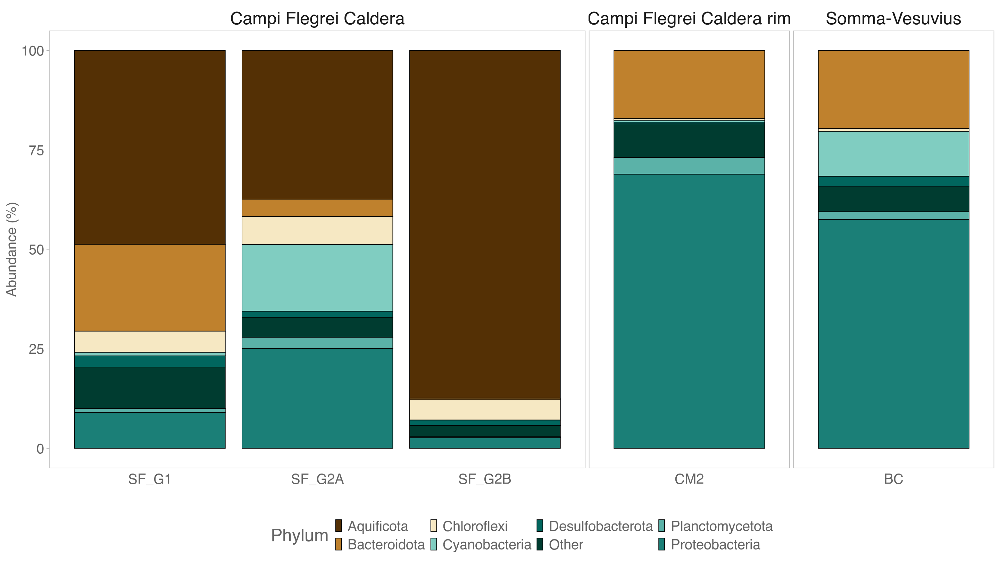

In [33]:
options(repr.plot.width=24, repr.plot.height=13.5)
p3 <- merge_low_abundance(prok_ra_phyla_biofilm, 0.01) %>%
transform_sample_counts(function(x){x*100}) %>%
plot_bar(fill="Phylum")+
    facet_grid(
        ~region, scale="free",space="free",
        labeller=labeller(code=labell_s)
    )+
    theme_glab()+
    theme(
        legend.position = "bottom",
        #axis.text.x = element_text(angle = 340, vjust = 0.5, hjust=0),
        axis.text=element_text(size=24),
        axis.title=element_text(size=24),
        legend.text = element_text(size=24),
        legend.title = element_text(size=30),
        panel.spacing = unit(0.4, "lines"),
        axis.ticks.x=element_blank(),
        strip.background = element_blank(),
        strip.placement = "outside",
        strip.text=element_text(size=30),
        panel.border = element_rect(size=1, colour ="gray")
    )+
    labs(y="Abundance (%)",
         x="") +

scale_fill_manual(values = CustomPalette) +

facetted_pos_scales(x=list(
        region=="Campi Flegrei Caldera" ~ scale_x_discrete(labels=c("SF_G1","SF_G2A", "SF_G2B")),
       
        region=="Campi Flegrei Caldera rim" ~ scale_x_discrete(labels=c("CM2")),

        region=="Somma-Vesuvius" ~ scale_x_discrete(labels=c("BC"))))


p3$data$Sample <- factor(p3$data$Sample, levels = order_s)


p3

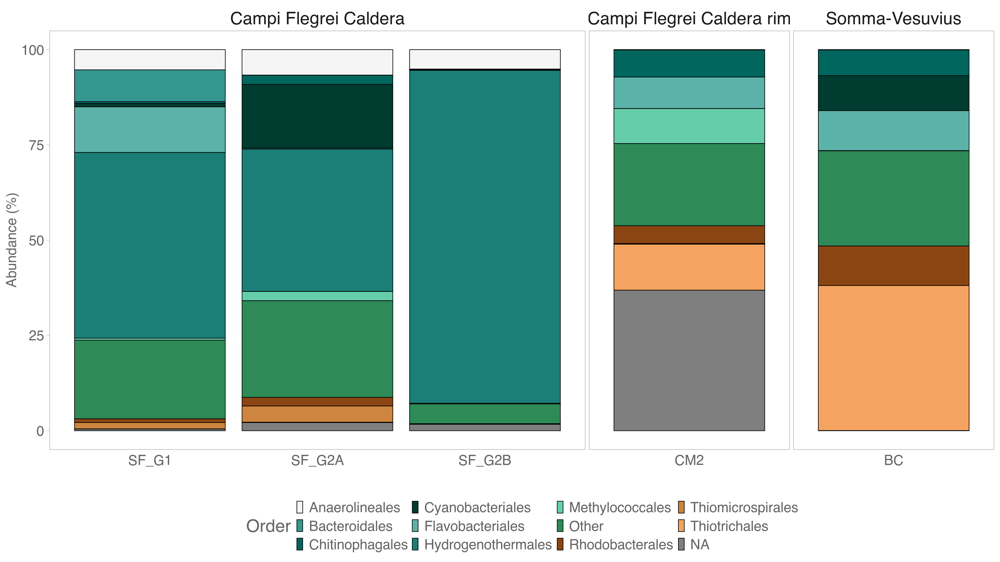

In [34]:
options(repr.plot.width=24, repr.plot.height=13.5)
p4 <- merge_low_abundance(prok_ra_order_biofilm, 0.01) %>%
transform_sample_counts(function(x){x*100}) %>%
plot_bar(fill="Order")+
    facet_grid(
        ~region, scale="free",space="free",
        labeller=labeller(code=labell_s)
    )+
    theme_glab()+
    theme(
        legend.position = "bottom",
        #axis.text.x = element_text(angle = 340, vjust = 0.5, hjust=0),
        axis.text=element_text(size=24),
        axis.title=element_text(size=24),
        legend.text = element_text(size=24),
        legend.title = element_text(size=30),
        panel.spacing = unit(0.4, "lines"),
        axis.ticks.x=element_blank(),
        strip.background = element_blank(),
        strip.placement = "outside",
        strip.text=element_text(size=30),
        panel.border = element_rect(size=1, colour ="gray")
    )+
    labs(y="Abundance (%)",
         x="") +

scale_fill_manual(values = CustomPalette2) +

facetted_pos_scales(x=list(
        region=="Campi Flegrei Caldera" ~ scale_x_discrete(labels=c("SF_G1","SF_G2A", "SF_G2B")),
       
        region=="Campi Flegrei Caldera rim" ~ scale_x_discrete(labels=c("CM2")),

        region=="Somma-Vesuvius" ~ scale_x_discrete(labels=c("BC"))))

#p$data$code<-factor(p$data$code, levels=order_sample)

p4$data$Sample <- factor(p4$data$Sample, levels = order_s)


p4

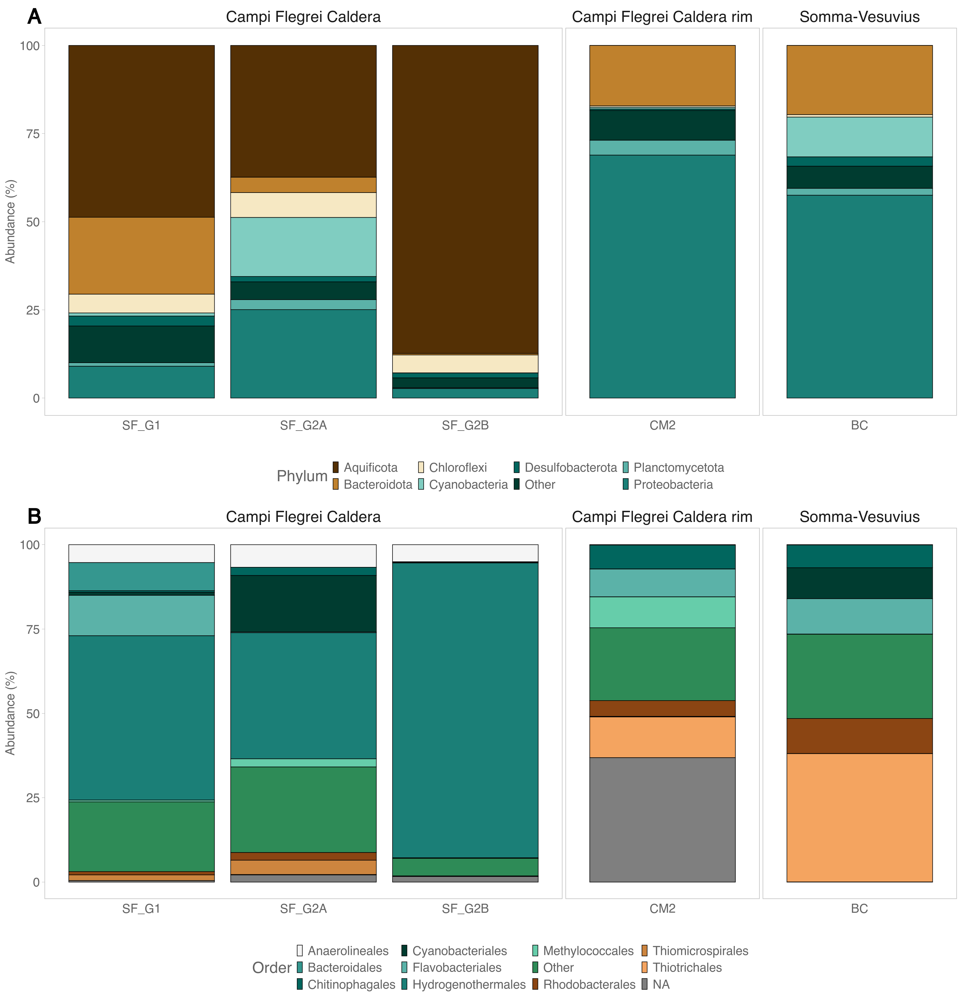

In [35]:
# Setting plots ratio
options(repr.plot.width=26, repr.plot.height=27)

ggarrange(p3,p4,
          labels=c("A", "B"), hjust=-2,
          font.label = list(size = 40),
          nrow=2,
          ncol=1,
          common.legend = FALSE,
          #widths=8,
          #heights=8,
          align="v"
          )

ggsave("Biofilm_plots.svg", width=35,height=27)

# Beta-Diversity analysis

## NMDS Jaccard similarity index: Weighted and Unweighted

In [22]:
prok_ndata_no_b <- subset_samples(prok_ndata, type != "biofilm")
prok_ndata_no_b

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 4612 taxa and 13 samples ]
sample_data() Sample Data:       [ 13 samples by 32 sample variables ]
tax_table()   Taxonomy Table:    [ 4612 taxa by 6 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 4612 tips and 4610 internal nodes ]

In [23]:
prok_dist_wjac <- phyloseq::distance(prok_ndata_no_b, method = "jaccard")
prok_dist_unjac <- phyloseq::distance(prok_ndata_no_b, method = "jaccard", binary = TRUE)

### Weighted Jaccard

In [24]:
# https://rdrr.io/bioc/phyloseq/man/distance.html
prok_nmds_jw <- ordinate(prok_ndata_no_b,prok_dist_wjac, method = "NMDS",trymax=100)

Run 0 stress 0.1267291 
Run 1 stress 0.1623002 
Run 2 stress 0.1267292 
... Procrustes: rmse 5.114102e-05  max resid 0.0001132197 
... Similar to previous best
Run 3 stress 0.1267291 
... New best solution
... Procrustes: rmse 5.045236e-05  max resid 0.0001491629 
... Similar to previous best
Run 4 stress 0.1618135 
Run 5 stress 0.1470975 
Run 6 stress 0.126729 
... New best solution
... Procrustes: rmse 0.0001634214  max resid 0.0004715439 
... Similar to previous best
Run 7 stress 0.126729 
... New best solution
... Procrustes: rmse 2.871034e-05  max resid 6.664507e-05 
... Similar to previous best
Run 8 stress 0.1470975 
Run 9 stress 0.126729 
... Procrustes: rmse 2.369539e-05  max resid 6.534755e-05 
... Similar to previous best
Run 10 stress 0.234132 
Run 11 stress 0.126729 
... Procrustes: rmse 2.534743e-05  max resid 6.7524e-05 
... Similar to previous best
Run 12 stress 0.1397665 
Run 13 stress 0.1397665 
Run 14 stress 0.1623003 
Run 15 stress 0.126729 
... Procrustes: rmse 5.5

Warning message in postMDS(out$points, dis, plot = max(0, plot - 1), ...):
“skipping half-change scaling: too few points below threshold”


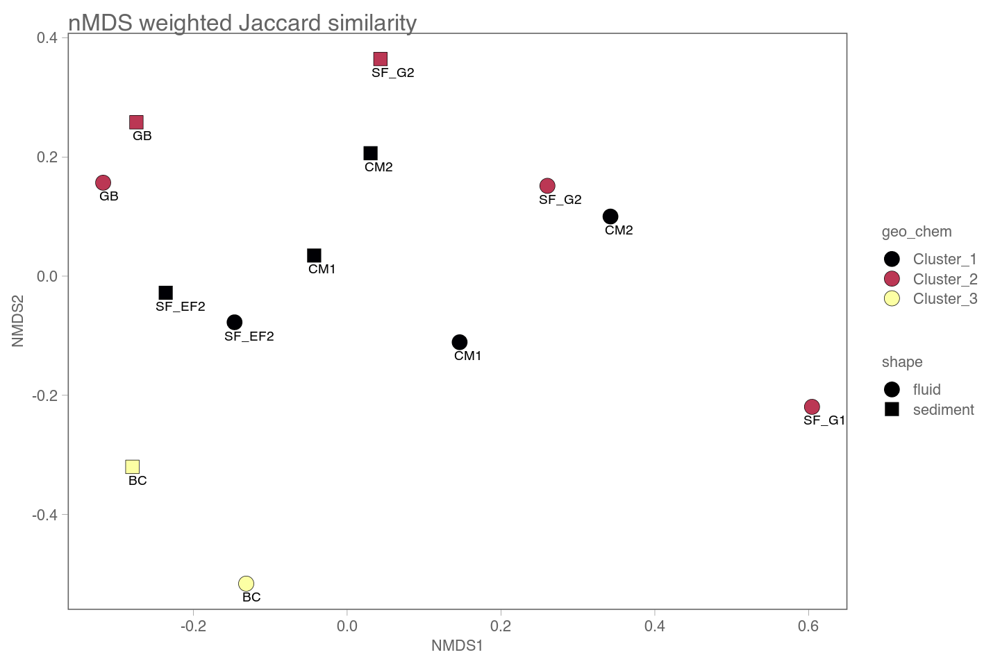

In [26]:
# nmds W jaccard

plot_ordination(prok_ndata_no_b, prok_nmds_jw, type="samples",title="nMDS weighted Jaccard similarity") +

    geom_point(aes(fill=geo_chem,shape=type),size=6,color="black",stroke=0.3) + 

    geom_text(aes(label= code), size=4, hjust=0.2,vjust=2) +

    scale_fill_viridis(discrete=TRUE, option="inferno") +

    scale_shape_manual(values=c(21:23)) +

    theme_glab() + theme(legend.position = "right") +

    guides(fill = guide_legend(override.aes = list(shape = 21) ),
            shape = guide_legend(override.aes = list(fill = "black")))

#ggsave("nmds_geochem_w.svg", width=12, height=8)

## Vector Fitting Weighted Jaccard

In [28]:
nmds_df1_jw<-cbind(sample_data(prok_ndata_no_b),prok_nmds_jw$points)
nmds_df1_jw

,code,location,type,region,geo_chem,lat,long,depth,temp,psu,⋯,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs,MDS1,MDS2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,CM1,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,-0.04292124,0.03461311
16,CM1,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,0.14621662,-0.11085260
11,CM2,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.03045258,0.20623079
13,CM2,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.34232607,0.10001981
17,GB,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.31723780,0.15676720
F,GB,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.27405372,0.25812247
10,SF_EF2,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.23585761,-0.02793810
18,SF_EF2,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.14641053,-0.07742004
14,SF_G1,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82306,14.08750,13.3,71.0,34.06,⋯,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868,0.60435780,-0.21931489


In [30]:
nmds_df1.1_jw <- nmds_df1_jw[,9:34]
nmds_df1.1_jw

,temp,psu,do,orp,ph,ms.cm,mVph,ppt.tds,Cl,Br,⋯,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs,MDS1,MDS2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,-0.04292124,0.03461311
16,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,0.14621662,-0.11085260
11,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.03045258,0.20623079
13,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.34232607,0.10001981
17,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.31723780,0.15676720
F,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.27405372,0.25812247
10,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.23585761,-0.02793810
18,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.14641053,-0.07742004
14,71.0,34.06,50.8,-159.0,5.45,51.80,77.8,25.90,18952.08,64.86,⋯,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868,0.60435780,-0.21931489


In [31]:
env_fit <- nmds_df1.1_jw %>%
  select(-NH3)
env_fit

,temp,psu,do,orp,ph,ms.cm,mVph,ppt.tds,Cl,Br,⋯,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs,MDS1,MDS2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,-0.04292124,0.03461311
16,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,0.14621662,-0.11085260
11,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.03045258,0.20623079
13,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.34232607,0.10001981
17,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.31723780,0.15676720
F,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.27405372,0.25812247
10,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.23585761,-0.02793810
18,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.14641053,-0.07742004
14,71.0,34.06,50.8,-159.0,5.45,51.80,77.8,25.90,18952.08,64.86,⋯,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868,0.60435780,-0.21931489


In [34]:
env_jw <-envfit(env_fit[,c(24:25)], env_fit[,c(1:23)], perm = 9999, na.rm = TRUE)
env_jw


***VECTORS

            MDS1     MDS2     r2 Pr(>r)   
temp     0.92386  0.38272 0.4129 0.1113   
psu      0.40980  0.91218 0.8374 0.0018 **
do       0.90785  0.41929 0.1342 0.5714   
orp      0.54389  0.83916 0.3899 0.1254   
ph      -0.05997 -0.99820 0.2043 0.3986   
ms.cm    0.44242  0.89681 0.7311 0.0135 * 
mVph     0.20780  0.97817 0.3928 0.1389   
ppt.tds  0.44342  0.89631 0.7342 0.0134 * 
Cl       0.42907  0.90327 0.7078 0.0159 * 
Br       0.42950  0.90307 0.6855 0.0173 * 
SO4      0.61675  0.78716 0.3962 0.1260   
Na       0.41693  0.90894 0.7148 0.0159 * 
K       -0.12496  0.99216 0.5764 0.0314 * 
Mg       0.62739  0.77870 0.4069 0.1161   
Ca      -0.59465  0.80399 0.2590 0.2997   
Mn      -0.54906  0.83578 0.3061 0.2246   
Fe      -0.60695  0.79474 0.3251 0.1971   
Zn      -0.36158 -0.93234 0.1583 0.4973   
As       0.76016  0.64974 0.3356 0.1860   
Rb      -0.06609  0.99781 0.2447 0.3202   
Sr       0.62092  0.78388 0.6330 0.0201 * 
Mo       0.74979  0.66168 0.1684 0.4646  

In [35]:
env.scores_jw <- as.data.frame(scores(env_jw, display = "vectors")) #extracts relevant scores from envifit
env.scores_jw <- cbind(env.scores_jw, env.variables = rownames(env.scores_jw)) #and then gives them their names

env.scores_jw <- cbind(env.scores_jw, pval = env_jw$vectors$pvals) # add pvalues to dataframe
sig.env.scrs_jw <- subset(env.scores_jw, pval<=0.05) #subset data to show variables significant at 0.05

sig.env.scrs_jw

,MDS1,MDS2,env.variables,pval
,<dbl>,<dbl>,<chr>,<dbl>
psu,0.37499405,0.8347056,psu,0.0018
ms.cm,0.37829427,0.7668175,ms.cm,0.0135
ppt.tds,0.37995323,0.7680161,ppt.tds,0.0134
Cl,0.36096878,0.7599112,Cl,0.0159
Br,0.35561658,0.7477124,Br,0.0173
Na,0.35248970,0.7684564,Na,0.0159
K,-0.09487132,0.7532488,K,0.0314
Sr,0.49401670,0.6236685,Sr,0.0201


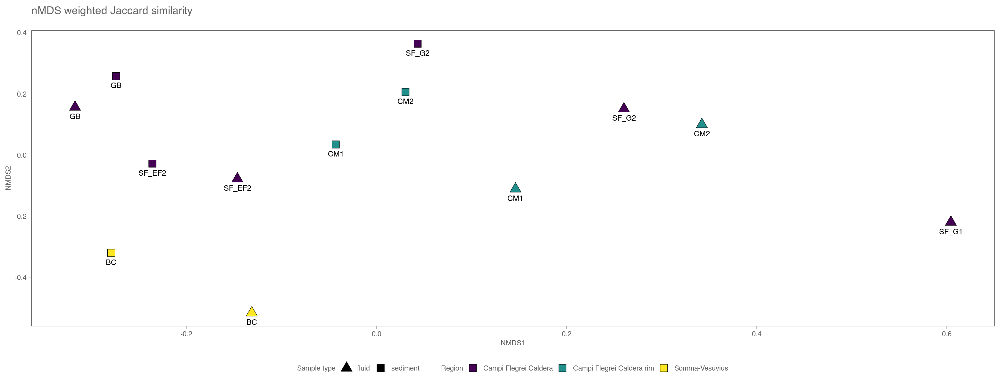

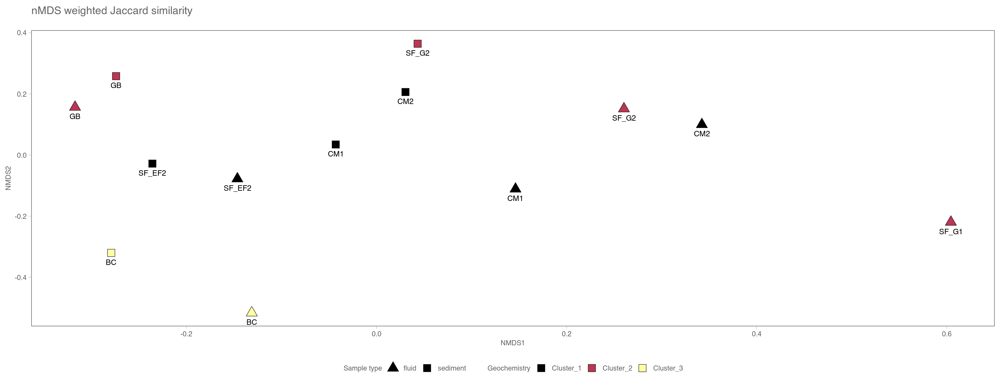

In [43]:
W_region <- ggplot(data = nmds_df1_jw, aes(x = MDS1, y = MDS2)) + 
     
     
        geom_point(aes(fill = region,shape=type), size = 7, show.legend=TRUE) +
    
        scale_fill_viridis(discrete=TRUE, option="viridis") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +
     
        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(title="nMDS weighted Jaccard similarity",
             subtitle="",
             shape="Sample type",
             fill="Region",
             x="NMDS1",
             y="NMDS2") +



        #xlab("NMDS1") + ylab("NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
        theme_glab() + 

        theme(legend.position = "bottom")

W_region

W_geochem <- ggplot(data = nmds_df1_jw, aes(x = MDS1, y = MDS2)) + 
     
     
        geom_point(aes(fill = geo_chem,shape=type), size = 7, show.legend=TRUE) +
    
        scale_fill_viridis(discrete=TRUE, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +
     
        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(title="nMDS weighted Jaccard similarity",
             subtitle="",
             shape="Sample type",
             fill="Geochemistry",
             x="NMDS1",
             y="NMDS2") +



        #xlab("NMDS1") + ylab("NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
        theme_glab() + 

        theme(legend.position = "bottom")

W_geochem


In [233]:
#ggsave("test2.svg", width=12, height=8)

## Ordisurf on the weighted -  6 most significant variables

### PSU

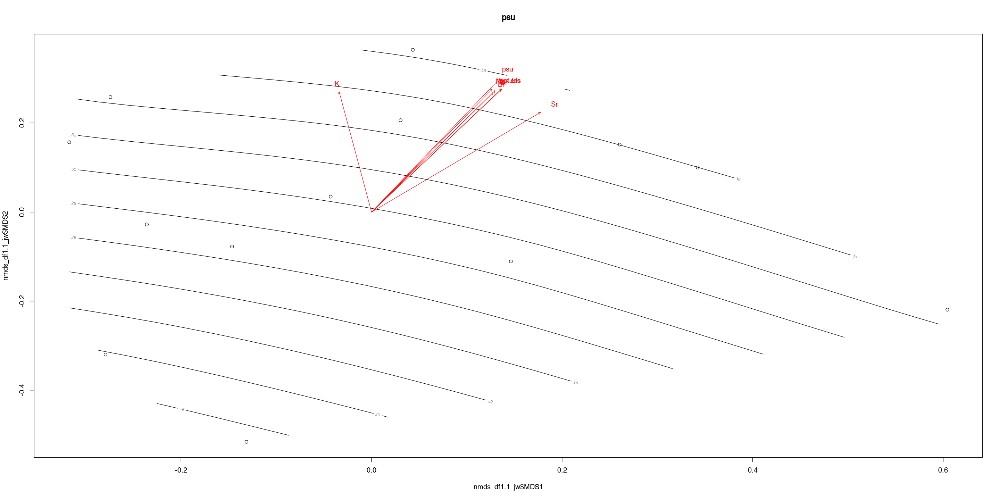

In [131]:
#PSU
env_ordsurf_psu<-ordisurf(prok_nmds_jw$points ~ psu, nmds_df1_jw, family=gaussian, plot = FALSE, scaling = 10)

plot(nmds_df1.1_jw$MDS1,nmds_df1.1_jw$MDS2, main = "psu")
plot(env_jw, p.max = 0.05, col = "red")
plot(env_ordsurf_psu, col = "black", add = TRUE)

In [132]:
ordi_grid <- env_ordsurf_psu$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.317 -0.287 -0.256 -0.225 -0.194 ...
 $ y: num [1:31] -0.516 -0.487 -0.457 -0.428 -0.399 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA ...


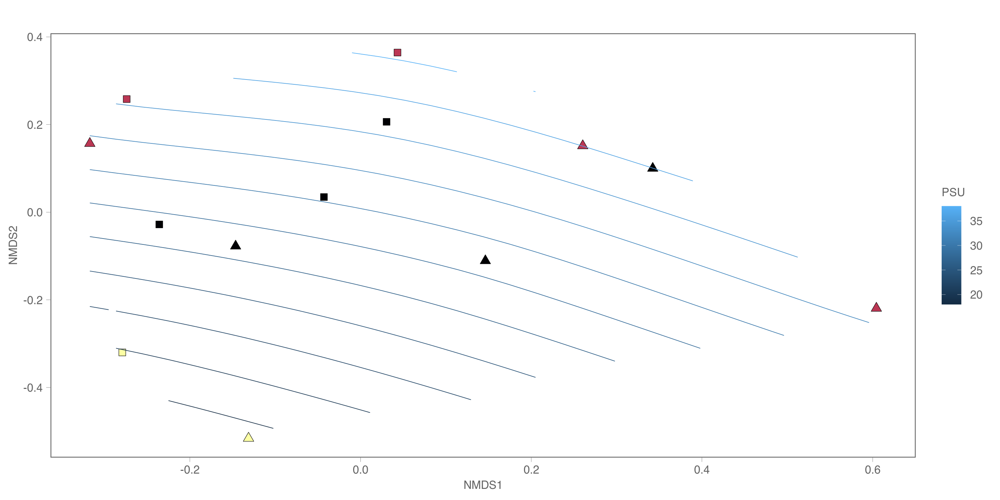

In [133]:
A <- nmds_jw_envfit <- ggplot(data = nmds_df1_jw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = geo_chem,shape=type), size = 6, show.legend=FALSE) +
    
        scale_fill_viridis(discrete=TRUE, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 

     
        #geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +
     
        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) +
       
        labs(subtitle="",
             x="NMDS1",
             y="NMDS2") +

        #xlab("NMDS1") + ylab("NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) +


        theme_glab(base_size = 30) + 


        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "PSU", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm")) 


nmds_jw_envfit

#ggsave("ordi_psu.svg", width=12, height=8)

### MS.CM

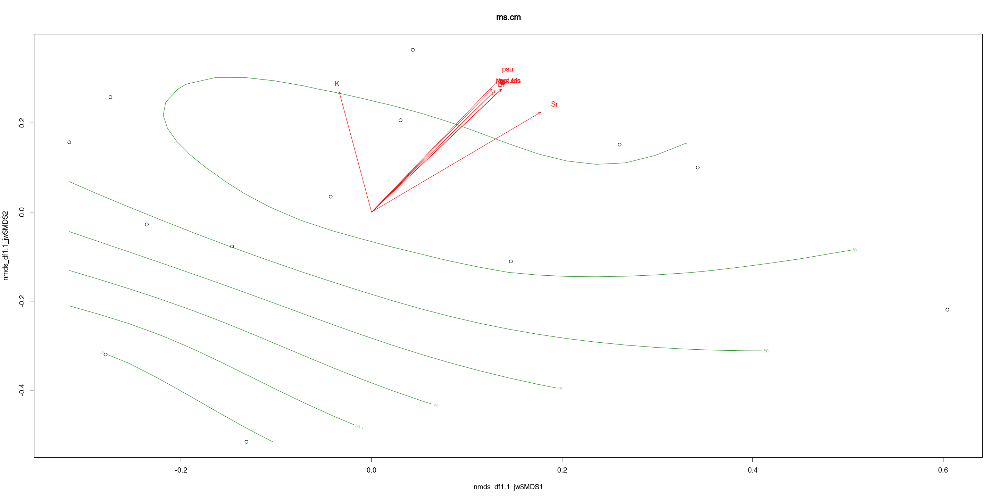

In [134]:
#ms.cm
env_ordsurf_ms_cm<-ordisurf(prok_nmds_jw$points ~ ms.cm, nmds_df1.1_jw, family=gaussian, plot = FALSE, scaling = 10)

plot(nmds_df1.1_jw$MDS1,nmds_df1.1_jw$MDS2, main = "ms.cm")
plot(env_jw, p.max = 0.05, col = "red")
plot(env_ordsurf_ms_cm, col = "forestgreen", add = TRUE)

In [135]:
ordi_grid <- env_ordsurf_ms_cm$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.317 -0.287 -0.256 -0.225 -0.194 ...
 $ y: num [1:31] -0.516 -0.487 -0.457 -0.428 -0.399 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA ...


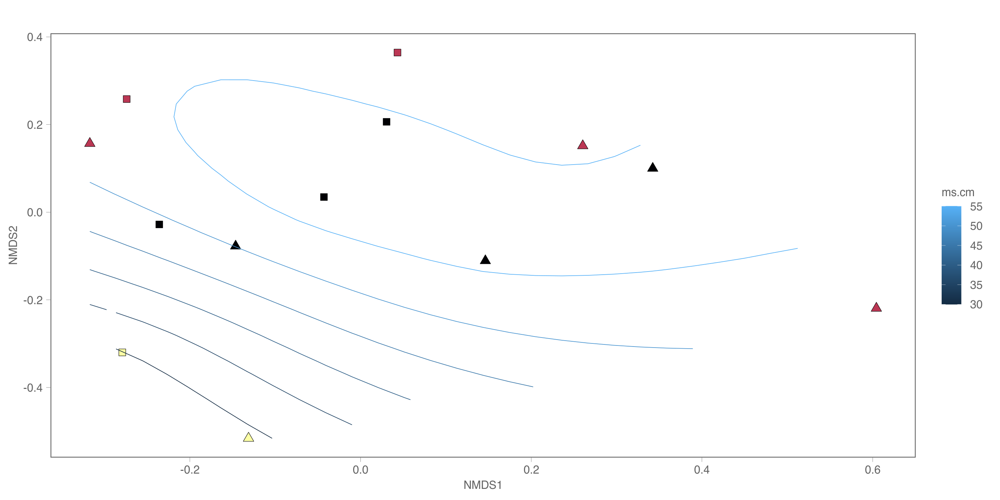

In [136]:
B <- nmds_jw_envfit <- ggplot(data = nmds_df1_jw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = geo_chem,shape=type), size = 6, show.legend=FALSE) +
    
        scale_fill_viridis(discrete=TRUE, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        #geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +
     
        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(subtitle="",
             shape="Sample type",
             fill="Region",
             x="NMDS1",
             y="NMDS2") +



        #xlab("NMDS1") + ylab("NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
        theme_glab(base_size = 30) + 


        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "ms.cm", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm")) 

nmds_jw_envfit

#ggsave("ordi_mscm.svg", width=12, height=8)

### Br

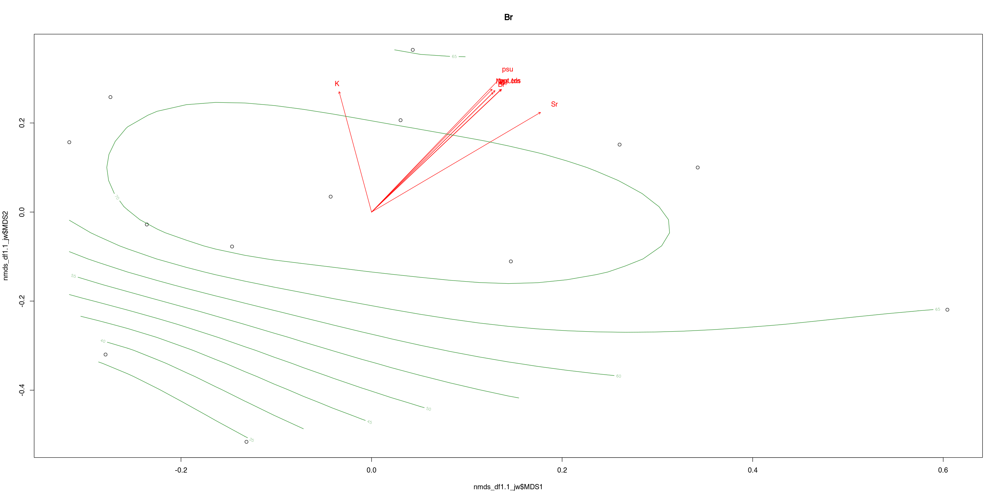

In [137]:
#br
env_ordsurf_br<-ordisurf(prok_nmds_jw$points ~ Br, nmds_df1.1_jw, family=gaussian, plot = FALSE, scaling = 10)

plot(nmds_df1.1_jw$MDS1,nmds_df1.1_jw$MDS2, main = "Br")
plot(env_jw, p.max = 0.05, col = "red")
plot(env_ordsurf_br, col = "forestgreen", add = TRUE)

In [138]:
ordi_grid <- env_ordsurf_br$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.317 -0.287 -0.256 -0.225 -0.194 ...
 $ y: num [1:31] -0.516 -0.487 -0.457 -0.428 -0.399 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA ...


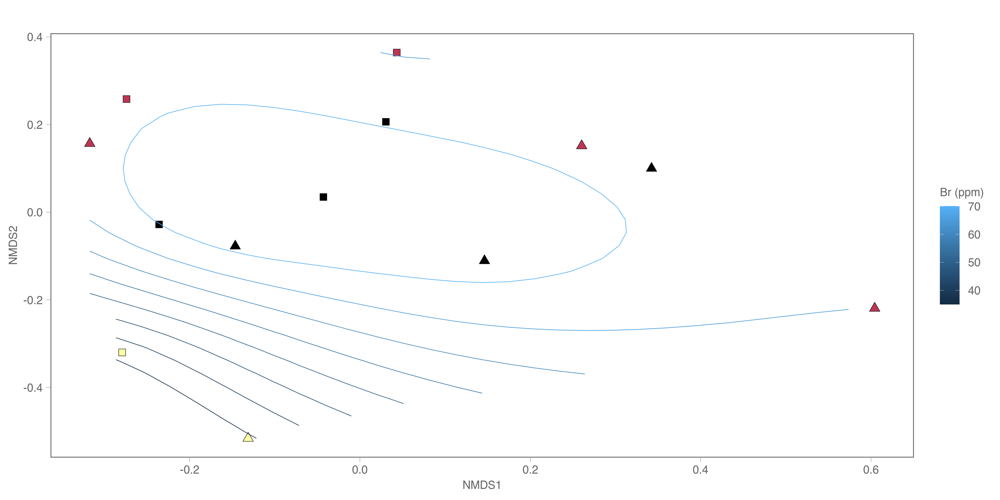

In [139]:
C <- nmds_jw_envfit <- ggplot(data = nmds_df1_jw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = geo_chem,shape=type), size = 6, show.legend=FALSE) +
    
        scale_fill_viridis(discrete=TRUE, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        #geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +
     
        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(subtitle="",
             shape="Sample type",
             fill="Region",
             x="NMDS1",
             y="NMDS2") +



        #xlab("NMDS1") + ylab("NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
       theme_glab(base_size = 30) + 


        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "Br (ppm)", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm")) 

nmds_jw_envfit

#ggsave("ordi_K.svg", width=12, height=8)

## Na

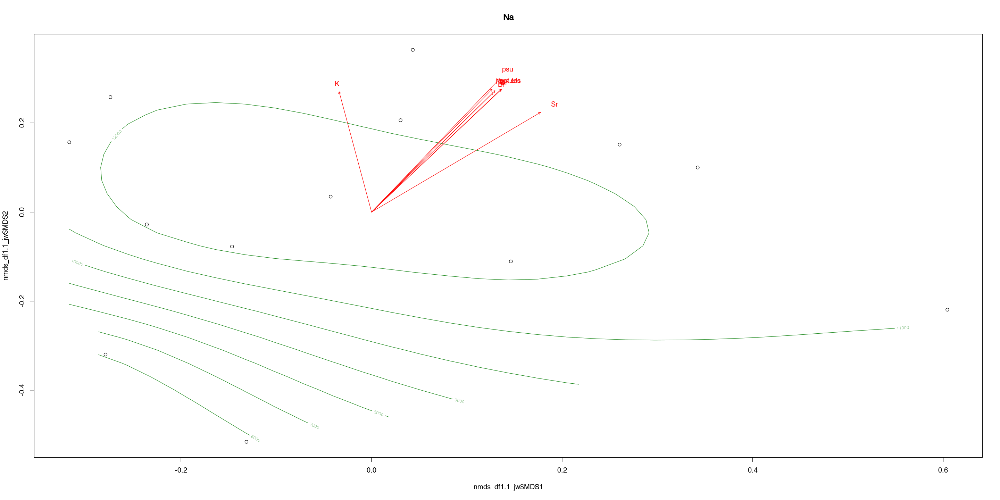

In [140]:
#Na
env_ordsurf_na<-ordisurf(prok_nmds_jw$points ~ Na, nmds_df1.1_jw, family=gaussian, plot = FALSE, scaling = 10)

plot(nmds_df1.1_jw$MDS1,nmds_df1.1_jw$MDS2, main = "Na")
plot(env_jw, p.max = 0.05, col = "red")
plot(env_ordsurf_na, col = "forestgreen", add = TRUE)

In [141]:
ordi_grid <- env_ordsurf_na$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.317 -0.287 -0.256 -0.225 -0.194 ...
 $ y: num [1:31] -0.516 -0.487 -0.457 -0.428 -0.399 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA ...


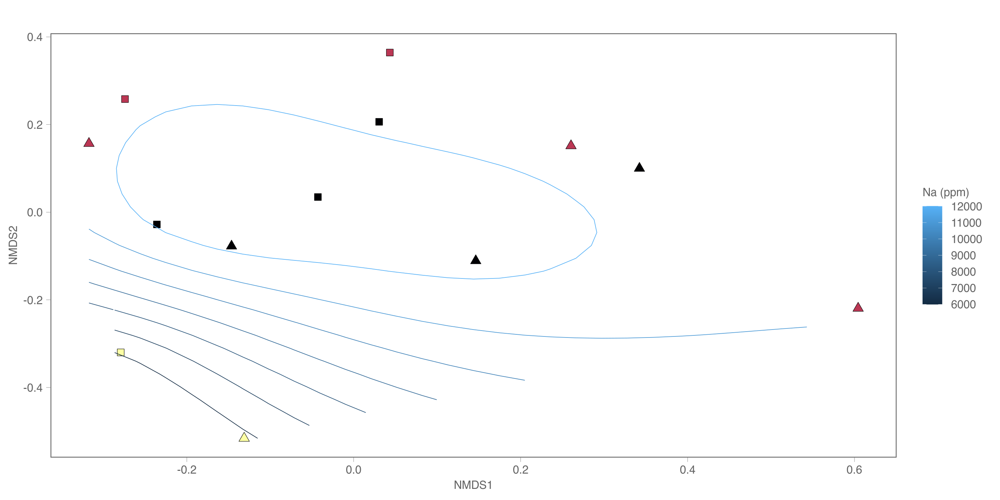

In [142]:
D <- nmds_jw_envfit <- ggplot(data = nmds_df1_jw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = geo_chem,shape=type), size = 6, show.legend=FALSE) +
    
        scale_fill_viridis(discrete=TRUE, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        #geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +
     
        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(subtitle="",
             shape="Sample type",
             fill="Region",
             x="NMDS1",
             y="NMDS2") +



        #xlab("NMDS1") + ylab("NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
         
       theme_glab(base_size = 30) + 


        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "Na (ppm)", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm")) 

nmds_jw_envfit

#ggsave("ordi_mg.svg", width=12, height=8)

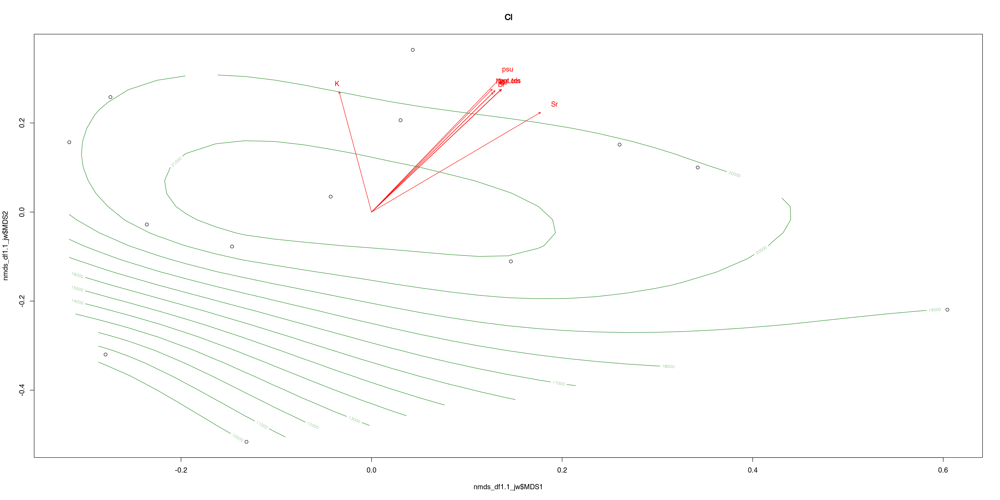

In [143]:
#Cl
env_ordsurf_Cl<-ordisurf(prok_nmds_jw$points ~ Cl, nmds_df1.1_jw, family=gaussian, plot = FALSE, scaling = 10)

plot(nmds_df1.1_jw$MDS1,nmds_df1.1_jw$MDS2, main = "Cl")
plot(env_jw, p.max = 0.05, col = "red")
plot(env_ordsurf_Cl, col = "forestgreen", add = TRUE)

In [144]:
ordi_grid <- env_ordsurf_Cl$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.317 -0.287 -0.256 -0.225 -0.194 ...
 $ y: num [1:31] -0.516 -0.487 -0.457 -0.428 -0.399 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA ...


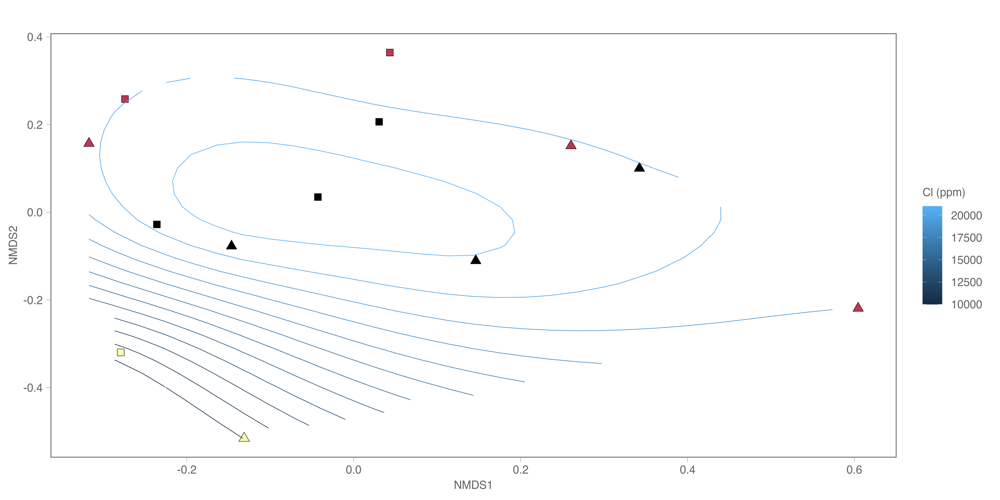

In [145]:
E <- nmds_jw_envfit <- ggplot(data = nmds_df1_jw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = geo_chem,shape=type), size = 6, show.legend=FALSE) +
    
        scale_fill_viridis(discrete=TRUE, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        #geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +
     
        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(subtitle="",
             shape="Sample type",
             fill="Region",
             x="NMDS1",
             y="NMDS2") +



        #xlab("NMDS1") + ylab("NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
        theme_glab(base_size = 30) + 

        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "Cl (ppm)", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm")) 
nmds_jw_envfit

#ggsave("ordi_cl.svg", width=12, height=8)

## ppt.tds

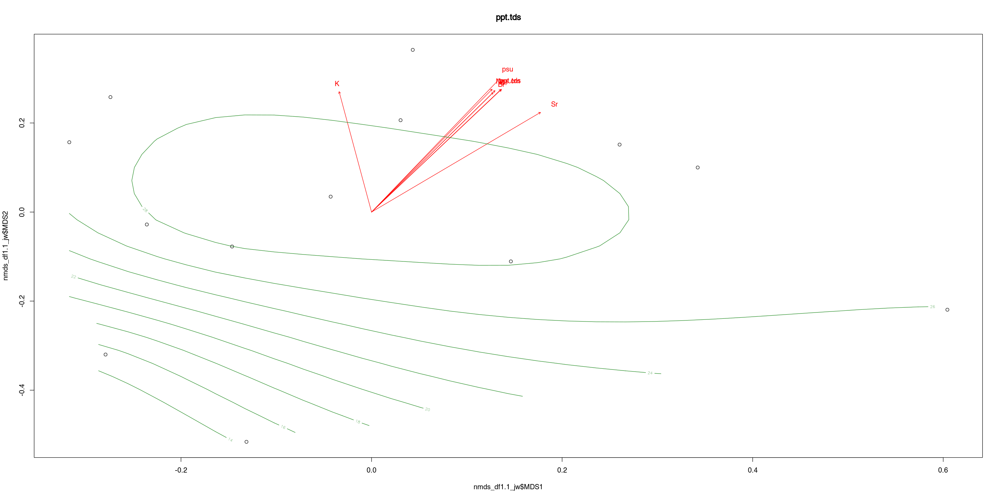

In [146]:
env_ordsurf_ppt_tds<-ordisurf(prok_nmds_jw$points ~ ppt.tds, nmds_df1.1_jw, family=gaussian, scaling=3, plot = FALSE)

plot(nmds_df1.1_jw$MDS1,nmds_df1.1_jw$MDS2, main = "ppt.tds")
plot(env_jw, p.max = 0.05, col = "red")
plot(env_ordsurf_ppt_tds, col = "forestgreen", add = TRUE)

In [147]:
ordi_grid <- env_ordsurf_ppt_tds$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.317 -0.287 -0.256 -0.225 -0.194 ...
 $ y: num [1:31] -0.516 -0.487 -0.457 -0.428 -0.399 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA ...


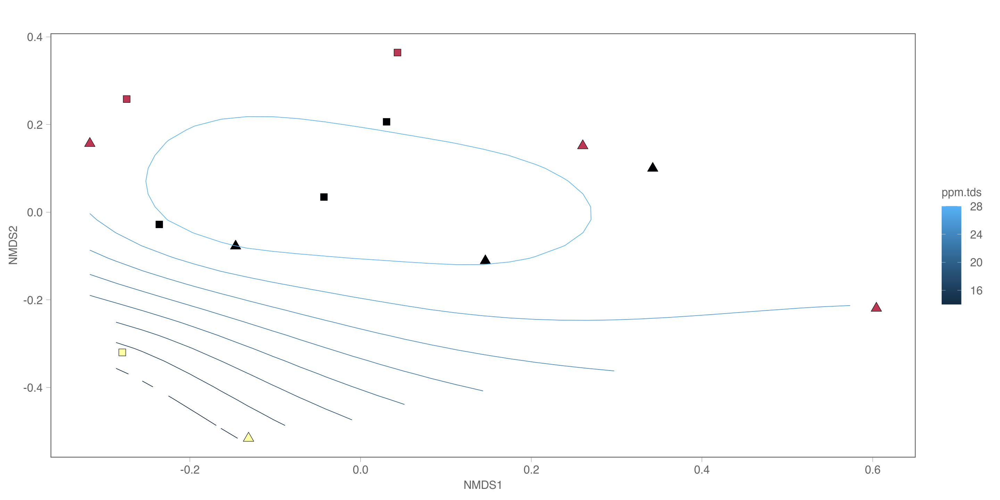

In [148]:
F <- nmds_jw_envfit <- ggplot(data = nmds_df1_jw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = geo_chem,shape=type), size = 6 , show.legend=FALSE) +
    
        scale_fill_viridis(discrete=TRUE, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        #geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +
     
        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(subtitle="",
             shape="Sample type",
             fill="Region",
             x="NMDS1",
             y="NMDS2") +



        #xlab("NMDS1") + ylab("NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
        theme_glab(base_size = 30) + 

        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "ppm.tds", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm")) 

nmds_jw_envfit

#ggsave("ordi_ppttds.svg", width=12, height=8)

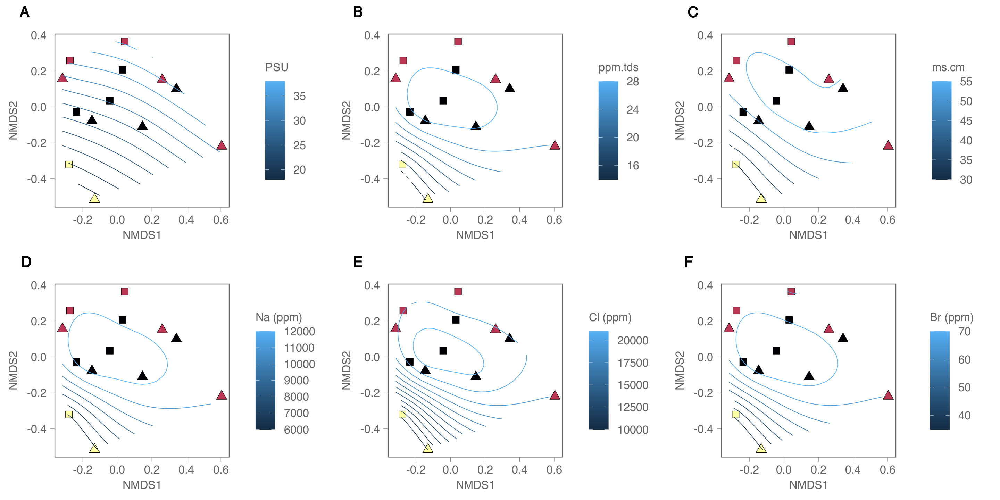

In [149]:
options(repr.plot.width=24, repr.plot.height=12)

ggarrange(A, F, B, 
          D, E, C, 
          labels=c("A", "B", "C", "D", "E", "F"), hjust=-2, 
          font.label = list(size = 25),
          nrow=2,
          ncol=3,
          common.legend = FALSE,
          widths=8,
          heights=8,
          align="hv"
          )

ggsave("ordisurf_weighted_final.svg", width = 26, height = 24) 

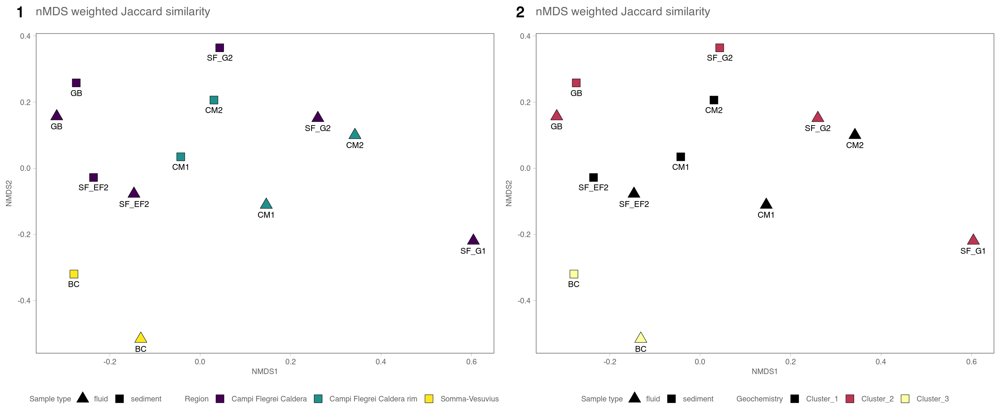

In [150]:
options(repr.plot.width=24, repr.plot.height=10)

ggarrange(W_region, W_geochem,
          labels=c("1", "2"), hjust=-2, 
          font.label = list(size = 25),
          nrow=1,
          ncol=2,
          common.legend = FALSE,
          widths=8,
          heights=8,
          align="hv"
          )

In [151]:
ggsave("nMDS_weighted_final.svg", width = 24, height = 10) 

## Unweighted Jaccard

In [152]:
prok_nmds_juw <- ordinate(prok_ndata_no_b,prok_dist_unjac, method = "NMDS",trymax=100)

Run 0 stress 0.1518495 
Run 1 stress 0.1498179 
... New best solution
... Procrustes: rmse 0.2273222  max resid 0.4440319 
Run 2 stress 0.2589767 
Run 3 stress 0.1498179 
... New best solution
... Procrustes: rmse 9.520609e-05  max resid 0.0001984224 
... Similar to previous best
Run 4 stress 0.1600944 
Run 5 stress 0.1672969 
Run 6 stress 0.1498176 
... New best solution
... Procrustes: rmse 0.001856711  max resid 0.003509019 
... Similar to previous best
Run 7 stress 0.1600944 
Run 8 stress 0.1861289 
Run 9 stress 0.1518495 
Run 10 stress 0.1600944 
Run 11 stress 0.2178897 
Run 12 stress 0.1672968 
Run 13 stress 0.2079739 
Run 14 stress 0.1498187 
... Procrustes: rmse 0.001177606  max resid 0.002207945 
... Similar to previous best
Run 15 stress 0.1672971 
Run 16 stress 0.149818 
... Procrustes: rmse 0.00199217  max resid 0.003798576 
... Similar to previous best
Run 17 stress 0.1600944 
Run 18 stress 0.1498189 
... Procrustes: rmse 0.001276592  max resid 0.002397587 
... Similar to 

Warning message in postMDS(out$points, dis, plot = max(0, plot - 1), ...):
“skipping half-change scaling: too few points below threshold”


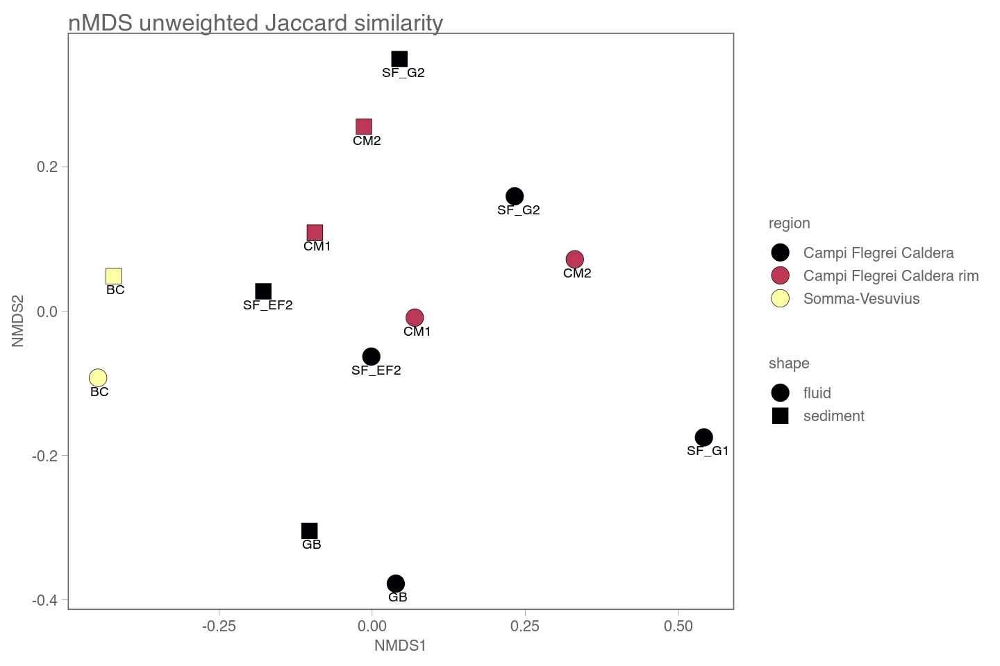

In [42]:
# nmds unweighted jaccard
plot_ordination(prok_ndata_no_b, prok_nmds_juw, type="samples",title="nMDS unweighted Jaccard similarity") +

        geom_point(aes(fill=region,shape=type),size=7,color="black",stroke=0.3) + 

        geom_text(aes(label= code), size=4, hjust=0.4,vjust=2) + 

        scale_fill_viridis(discrete=TRUE, option='inferno') + scale_shape_manual(values=c(21:23)) +

        theme_glab() + theme(legend.position = "right") +

        guides(fill = guide_legend(override.aes = list(shape = 21) ),
              shape = guide_legend(override.aes = list(fill = "black")))

#ggsave("nmds_geochem_unw.svg", width=12, height=8)

## Vector Fitting Unweighted Jaccard

In [153]:
nmds_df1_juw <- cbind(sample_data(prok_ndata_no_b),prok_nmds_juw$points)
nmds_df1_juw

,code,location,type,region,geo_chem,lat,long,depth,temp,psu,⋯,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs,MDS1,MDS2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,CM1,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,-0.0931347891,0.10772510
16,CM1,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,0.0705063461,-0.00898969
11,CM2,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,-0.0128980073,0.25445147
13,CM2,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.3309557203,0.07254237
17,GB,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,0.0361810047,-0.37875484
F,GB,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.1035044004,-0.30448167
10,SF_EF2,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.1765596015,0.02420863
18,SF_EF2,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,0.0007110488,-0.06351554
14,SF_G1,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82306,14.08750,13.3,71.0,34.06,⋯,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868,0.5410690845,-0.17400381


In [155]:
nmds_df1.1_juw <- nmds_df1_juw[,9:34]
nmds_df1.1_juw

,temp,psu,do,orp,ph,ms.cm,mVph,ppt.tds,Cl,Br,⋯,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs,MDS1,MDS2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,-0.0931347891,0.10772510
16,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,0.0705063461,-0.00898969
11,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,-0.0128980073,0.25445147
13,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.3309557203,0.07254237
17,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,0.0361810047,-0.37875484
F,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.1035044004,-0.30448167
10,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.1765596015,0.02420863
18,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,0.0007110488,-0.06351554
14,71.0,34.06,50.8,-159.0,5.45,51.80,77.8,25.90,18952.08,64.86,⋯,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868,0.5410690845,-0.17400381


In [156]:
env_fit <- nmds_df1.1_juw %>%
  select(-NH3)
env_fit

,temp,psu,do,orp,ph,ms.cm,mVph,ppt.tds,Cl,Br,⋯,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs,MDS1,MDS2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,-0.0931347891,0.10772510
16,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033,0.0705063461,-0.00898969
11,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,-0.0128980073,0.25445147
13,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425,0.3309557203,0.07254237
17,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,0.0361810047,-0.37875484
F,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143,-0.1035044004,-0.30448167
10,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,-0.1765596015,0.02420863
18,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302,0.0007110488,-0.06351554
14,71.0,34.06,50.8,-159.0,5.45,51.80,77.8,25.90,18952.08,64.86,⋯,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868,0.5410690845,-0.17400381


In [157]:
env_juw <- envfit(env_fit[,c(24:25)], env_fit[,c(1:23)], perm = 9999, na.rm = T)
env_juw


***VECTORS

            MDS1     MDS2     r2 Pr(>r)  
temp     0.84940  0.52774 0.4096 0.1257  
psu      0.99709  0.07627 0.5557 0.0380 *
do       0.28698  0.95794 0.2888 0.2515  
orp      0.69597  0.71807 0.3221 0.2077  
ph      -0.55645  0.83088 0.4080 0.1282  
ms.cm    0.98782  0.15560 0.5021 0.0613 .
mVph     0.73025 -0.68318 0.4945 0.0697 .
ppt.tds  0.98630  0.16496 0.5033 0.0612 .
Cl       0.99289  0.11904 0.4822 0.0739 .
Br       0.99502  0.09967 0.4714 0.0796 .
SO4      0.92922  0.36952 0.3333 0.2007  
Na       0.99564  0.09325 0.4819 0.0752 .
K        0.59106 -0.80663 0.3571 0.1721  
Mg       0.92345  0.38373 0.3460 0.1850  
Ca      -0.99676 -0.08048 0.0124 0.9484  
Mn       0.18126 -0.98344 0.4617 0.0824 .
Fe       0.13697 -0.99058 0.4869 0.0653 .
Zn      -0.56630 -0.82420 0.1064 0.6503  
As       0.86080  0.50894 0.3202 0.2107  
Rb       0.52813 -0.84917 0.3308 0.2023  
Sr       0.99624  0.08667 0.5808 0.0303 *
Mo       0.42639  0.90454 0.2547 0.3066  
Cs       0.88575  0.4

In [158]:
env.scores_juw <- as.data.frame(scores(env_juw, display = "vectors")) #extracts relevant scores from envifit
env.scores_juw <- cbind(env.scores_juw, env.variables = rownames(env.scores_juw)) #and then gives them their names

env.scores_juw <- cbind(env.scores_juw, pval = env_juw$vectors$pvals) # add pvalues to dataframe
sig.env.scrs_juw <- subset(env.scores_juw, pval<=0.05) #subset data to show variables significant at 0.05

sig.env.scrs_juw

,MDS1,MDS2,env.variables,pval
,<dbl>,<dbl>,<chr>,<dbl>
psu,0.7432916,0.05685799,psu,0.0380
Sr,0.7592024,0.06604563,Sr,0.0303


In [159]:
#prok_nmds_unif_no_b_envfit_df
en_coord_cont.1_juw = sig.env.scrs_juw[,1:2] * ordiArrowMul(env_juw)
en_coord_cont.1_juw

,MDS1,MDS2
,<dbl>,<dbl>
psu,0.7342821,0.05616881
Sr,0.7500000,0.06524508


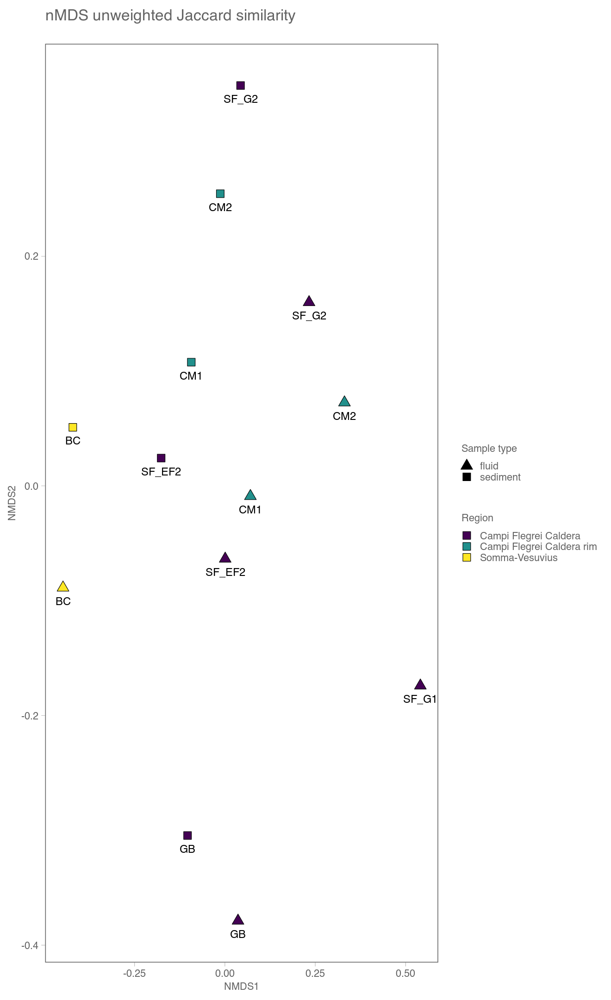

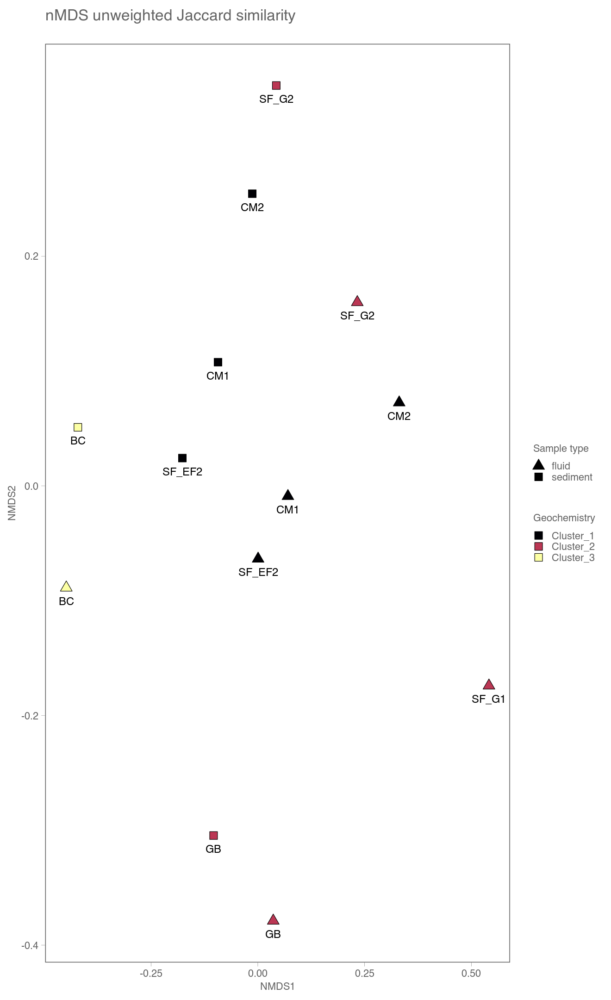

In [43]:
UW_region <- ggplot(data = nmds_df1_juw, aes(x = MDS1, y = MDS2)) + 
     
        #geom_segment(data = en_coord_cont.1_juw, aes(x = 0, y = 0, xend = MDS1/1.5, yend = MDS2/1.5), 
        #                    size =.8, alpha = 0.8, colour = "grey") + 
     
       # geom_text(data = en_coord_cont.1_juw, aes(x = MDS1/1.5, y = MDS2/1.5), colour = "grey30", 
       #                   size=6, label = row.names(en_coord_cont.1_juw)) + 
     
        geom_point(aes(fill = region, shape=type), size = 5, show.legend=TRUE) +
    
        scale_fill_viridis(discrete = T, option="viridis") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +

        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(title="nMDS unweighted Jaccard similarity",
             subtitle="",
             shape="Sample type",
             fill="Region",
             x="NMDS1",
             y="NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
        theme_glab() + 

        theme(legend.position = "right")

UW_region

UW_geochem  <- ggplot(data = nmds_df1_juw, aes(x = MDS1, y = MDS2)) + 
     
        #geom_segment(data = en_coord_cont.1_juw, aes(x = 0, y = 0, xend = MDS1/1.5, yend = MDS2/1.5), 
        #                    size =.8, alpha = 0.8, colour = "grey") + 
     
       # geom_text(data = en_coord_cont.1_juw, aes(x = MDS1/1.5, y = MDS2/1.5), colour = "grey30", 
       #                   size=6, label = row.names(en_coord_cont.1_juw)) + 
     
        geom_point(aes(fill = geo_chem, shape=type), size = 5, show.legend=TRUE) +
    
        scale_fill_viridis(discrete = T, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +

        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(title="nMDS unweighted Jaccard similarity",
             subtitle="",
             shape="Sample type",
             fill="Geochemistry",
             x="NMDS1",
             y="NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
        theme_glab() + 

        theme(legend.position = "right")

UW_geochem

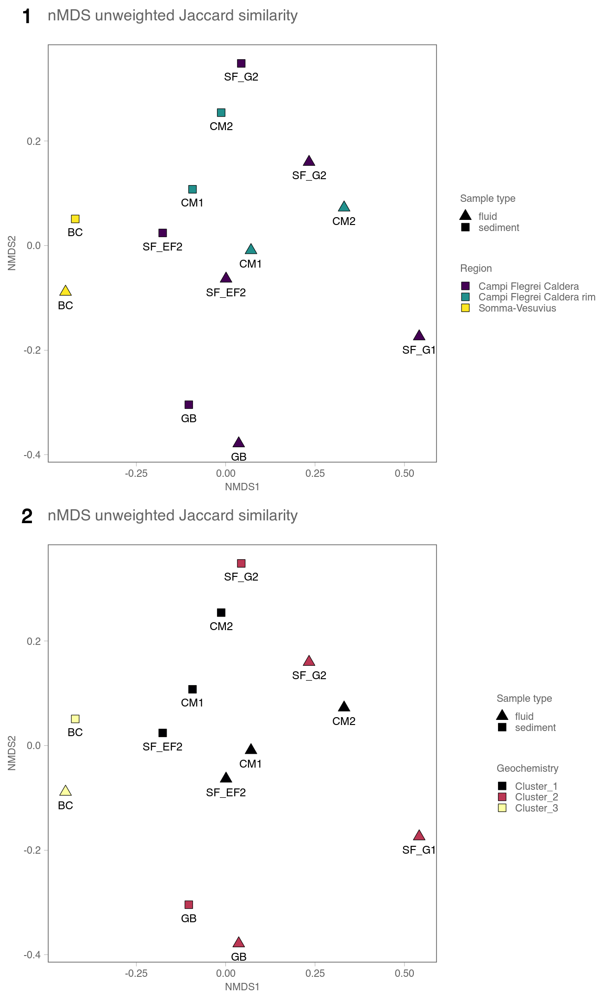

In [44]:
options(repr.plot.width=11, repr.plot.height=18)

ggarrange(UW_region, UW_geochem,
          labels=c("1", "2"), hjust=-2, 
          font.label = list(size = 25),
          nrow=2,
          ncol=1,
          common.legend = FALSE,
          widths=8,
          heights=8,
          align="hv"
          )

In [45]:
ggsave("nMDS_vector_fitting_unweighted_supplementary.svg", width=15, height=24)

# Comparing weighted versus unweighted Jacard

In [173]:
proW_UWJ <- procrustes(X = prok_nmds_juw, Y = prok_nmds_jw, symmetric = FALSE)
proW_UWJ


Call:
procrustes(X = prok_nmds_juw, Y = prok_nmds_jw, symmetric = FALSE) 

Procrustes sum of squares:
0.9066 


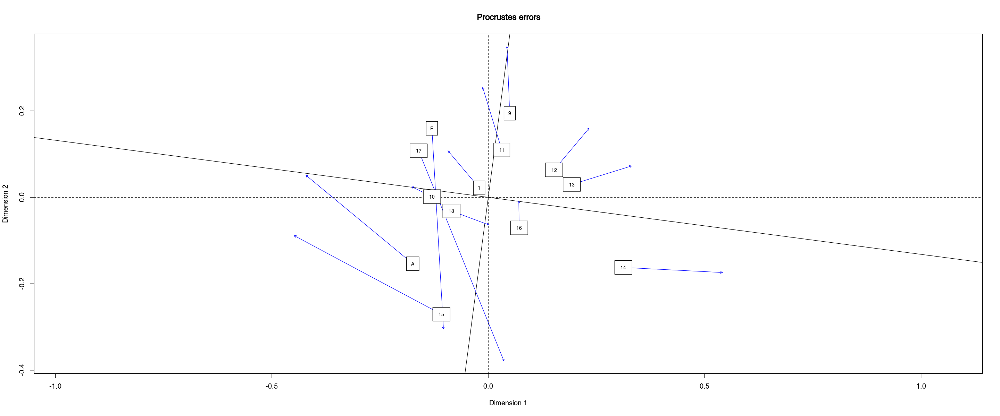

In [174]:
plot(proW_UWJ, kind = 1, type = "text")

## Ordisurf Unweighted 

## PSU

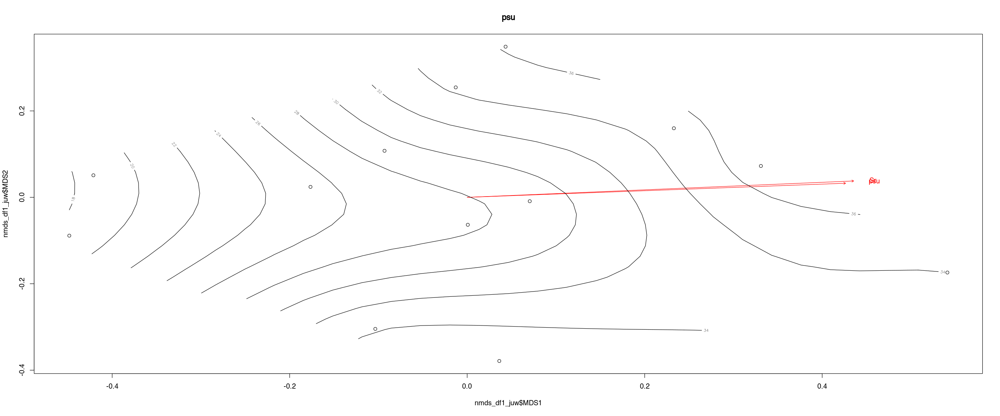

In [177]:
#PSU
env_ordsurf_psu<-ordisurf(prok_nmds_juw$points ~ psu, nmds_df1_juw, family=gaussian, plot = FALSE, scaling = 10)

plot(nmds_df1_juw$MDS1,nmds_df1_juw$MDS2, main = "psu")
plot(env_juw, p.max = 0.05, col = "red")
plot(env_ordsurf_psu, col = "black", add = TRUE)

In [178]:
ordi_grid <- env_ordsurf_psu$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.448 -0.415 -0.382 -0.349 -0.316 ...
 $ y: num [1:31] -0.379 -0.355 -0.33 -0.306 -0.282 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA NA NA NA NA NA ...


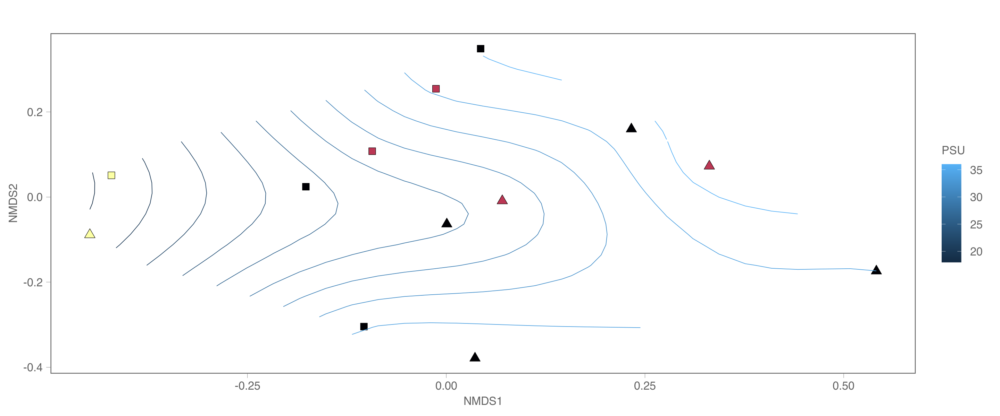

In [179]:
A1 <- nmds_juw_envfit <- ggplot(data = nmds_df1_juw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = region,shape=type), size = 6, show.legend=FALSE) +
    
        scale_fill_viridis(discrete = T, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
       # geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +

        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(subtitle="",
             shape="Sample type",
             fill="Mixing trends",
             x="NMDS1",
             y="NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
         theme_glab(base_size = 30) + 

        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "PSU", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm")) 

nmds_juw_envfit

#ggsave("ordi_un_psu.svg", width=12, height=8)

In [213]:
ordi_grid <- env_ordsurf_k$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.448 -0.415 -0.382 -0.349 -0.316 ...
 $ y: num [1:31] -0.377 -0.353 -0.329 -0.305 -0.281 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA NA NA NA NA NA ...


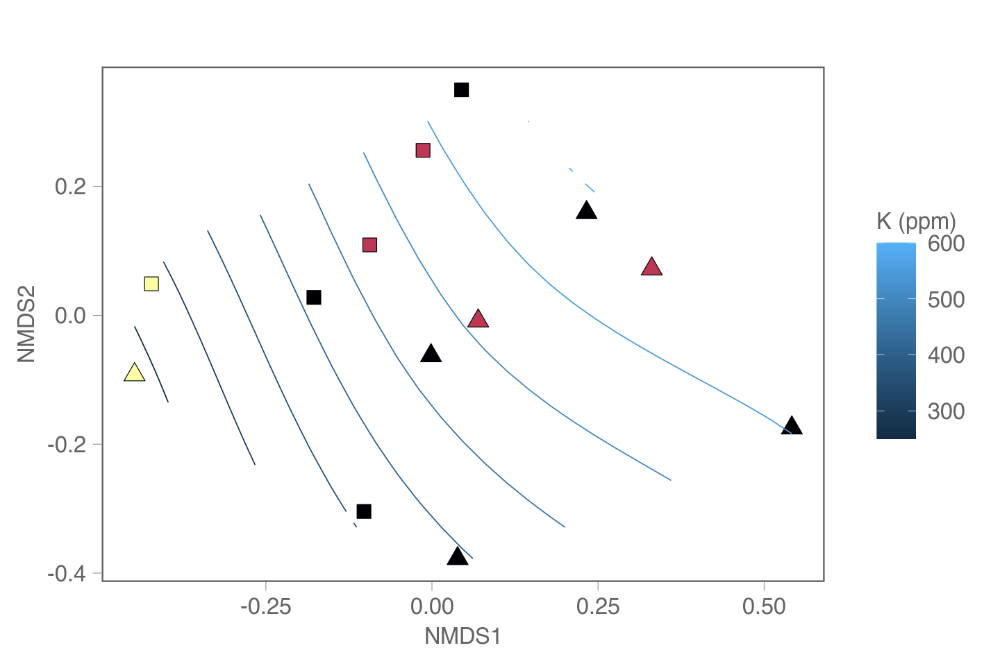

In [214]:
B1 <- nmds_juw_envfit <- ggplot(data = nmds_df1_juw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = region,shape=type), size = 6, show.legend=FALSE) +    
       
        scale_fill_viridis(discrete = T, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        #geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +

        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(subtitle="",
             shape="Sample type",
             fill="Mixing trends",
             x="NMDS1",
             y="NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
        theme_glab(base_size = 30) + 

        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "K (ppm)", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm"))

nmds_juw_envfit

#ggsave("ordi_un_k.svg", width=12, height=8)

## Sr

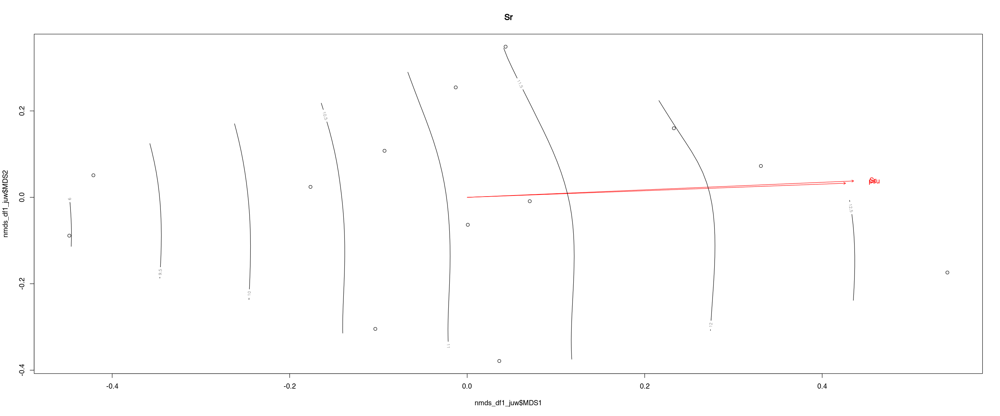

In [180]:
#Sr
env_ordsurf_sr<-ordisurf(prok_nmds_juw$points ~ Sr, nmds_df1_juw, family=gaussian, plot = FALSE, scaling = 10)

plot(nmds_df1_juw$MDS1,nmds_df1_juw$MDS2, main = "Sr")
plot(env_juw, p.max = 0.05, col = "red")
plot(env_ordsurf_sr, col = "black", add = TRUE)

In [181]:
ordi_grid <- env_ordsurf_sr$grid
str(ordi_grid)
ordi_mite <- expand.grid(x=ordi_grid$x, y=ordi_grid$y)
ordi_mite$z <- as.vector(ordi_grid$z)
ordi_mite_na <- data.frame(na.omit(ordi_mite))

List of 3
 $ x: num [1:31] -0.448 -0.415 -0.382 -0.349 -0.316 ...
 $ y: num [1:31] -0.379 -0.355 -0.33 -0.306 -0.282 ...
 $ z: num [1:31, 1:31] NA NA NA NA NA NA NA NA NA NA ...


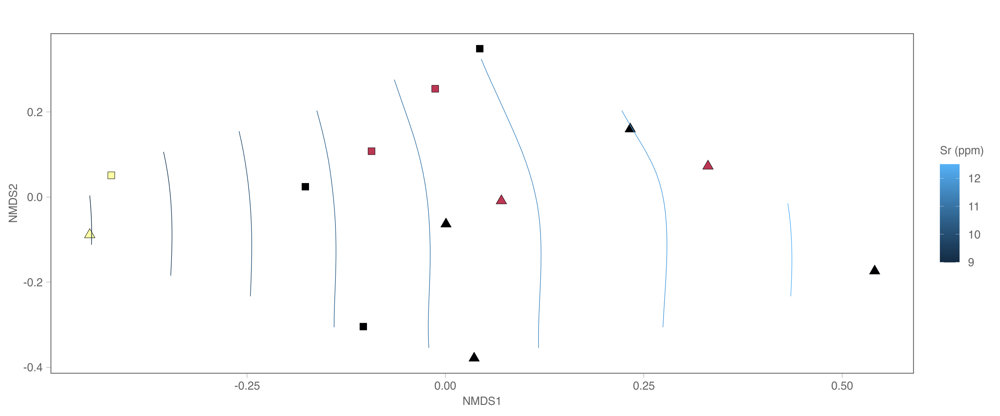

In [182]:
D1 <- nmds_juw_envfit <- ggplot(data = nmds_df1_juw, aes(x = MDS1, y = MDS2)) + 
     
        geom_point(aes(fill = region, shape=type), size = 6, show.legend=FALSE) +
    
        scale_fill_viridis(discrete = T, option="inferno") +
     
        scale_shape_manual(values = c(24,22,23)) + 
     
        #geom_text(aes(label= code), size=5, hjust=0.5, vjust=2.2) +

        theme(axis.title = element_text(size = 15, face = "bold", colour = "black"), 
                   panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "black"), 
                   axis.ticks = element_blank(), legend.key = element_blank(), 
                   legend.title = element_text(size = 10, face = "bold", colour = "grey30"), 
                   legend.text = element_text(size = 9, colour = "grey30")) + 
       
        labs(subtitle="",
             shape="Sample type",
             fill="Mixing trends",
             x="NMDS1",
             y="NMDS2") + 
       
        guides(fill = guide_legend(override.aes = list(shape = 22) ),
            shape = guide_legend(override.aes = list(fill = "black"))) + 
        
         theme_glab(base_size = 30) + 

        #theme(legend.position = "right") +

        stat_contour(data=ordi_mite_na, aes(x=x, y=y, z=z, colour = after_stat(level)), position ='identity') + labs(color = "Sr (ppm)", size=21) +
        
        theme(legend.key.size = unit(1.2, "cm"))
nmds_juw_envfit

#ggsave("ordi_un_sr.svg", width=12, height=8)

## PCoA Jaccard

### Weighted PCoA Jaccard

In [183]:
prok_pcoa_jw <- ordinate(prok_ndata_no_b,prok_dist_wjac, method = "PCoA")
evals_jw <- prok_pcoa_jw$values$Eigenvalues

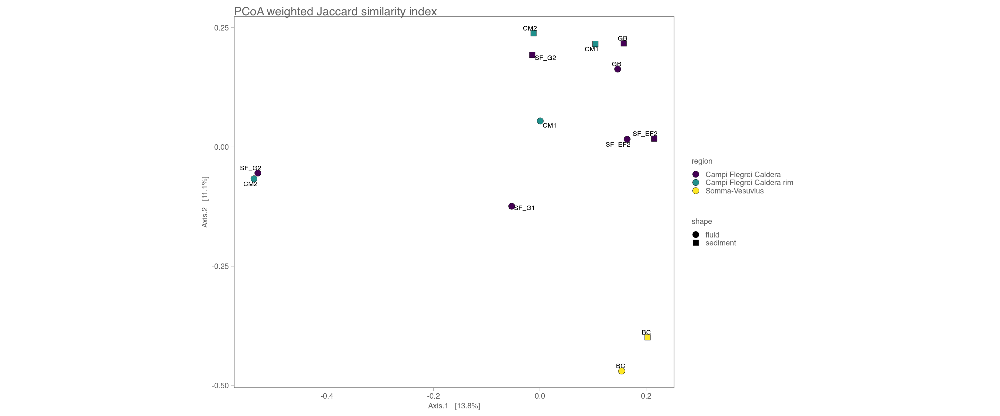

In [184]:
plot_ordination(prok_ndata_no_b, prok_pcoa_jw, type="samples", title="PCoA weighted Jaccard similarity index") +

        coord_fixed(sqrt(evals_jw[2] / evals_jw[1]))  + 

        geom_point(aes(fill=region,shape=type),size=5,color="black",stroke=0.3) + 

        geom_text_repel(aes(label= code), size=4, hjust=1,vjust=0.5) +

        scale_fill_viridis(discrete=TRUE) + scale_shape_manual(values=c(21:23)) +

        theme_glab() + theme(legend.position = "right") +

        guides(fill = guide_legend(override.aes = list(shape = 21) ),
              shape = guide_legend(override.aes = list(fill = "black")))

### Vector Fitting PCoA jaccard weighted

In [185]:
pcoa_prok.v.Wj<-data.frame(prok_pcoa_jw$vectors[,1:2])
pcoa_prok.v.Wj

,Axis.1,Axis.2
,<dbl>,<dbl>
1,0.1045456210,0.21592794
16,0.0009553084,0.05444673
11,-0.0115814276,0.23816262
13,-0.5373544471,-0.06678786
17,0.1464328823,0.16307722
F,0.1577960488,0.21696250
10,0.2154174603,0.01725125
18,0.1642321520,0.01601808
14,-0.0527705286,-0.12430406


In [186]:
pcoa_df <- sample_data(prok_ndata_no_b)
pcoa_df

,code,location,type,region,geo_chem,lat,long,depth,temp,psu,⋯,Mg,Ca,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,CM1,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
16,CM1,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
11,CM2,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
13,CM2,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
17,GB,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
F,GB,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
10,SF_EF2,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302
18,SF_EF2,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302
14,SF_G1,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82306,14.08750,13.3,71.0,34.06,⋯,1096.41,446.81,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868


In [189]:
pcoa_df2 <- pcoa_df[,9:31]
pcoa_df2

,temp,psu,do,orp,ph,ms.cm,mVph,ppt.tds,Cl,Br,⋯,K,Mg,Ca,Mn,Fe,Zn,As,Rb,Sr,Mo
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,397.03,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804
16,26.3,27.54,55.0,-115.4,5.87,56.58,55.6,28.35,21094.04,72.48,⋯,397.03,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804
11,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,389.49,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593
13,27.0,38.37,92.0,54.2,6.30,57.54,46.5,28.76,20846.61,72.06,⋯,389.49,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593
17,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,597.37,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985
F,28.0,35.41,43.0,-145.2,5.33,53.64,83.5,26.80,19842.83,68.07,⋯,597.37,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985
10,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,403.69,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988
18,34.0,26.50,75.0,-173.0,5.25,NA,90.0,28.50,20741.32,72.20,⋯,403.69,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988
14,71.0,34.06,50.8,-159.0,5.45,51.80,77.8,25.90,18952.08,64.86,⋯,380.81,1096.41,446.81,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486


In [192]:
pcoa_df3 <- subset(pcoa_df2, select = -c(ms.cm,NH3))
pcoa_df3

,temp,psu,do,orp,ph,mVph,ppt.tds,Cl,Br,SO4,⋯,K,Mg,Ca,Mn,Fe,Zn,As,Rb,Sr,Mo
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,26.3,27.54,55.0,-115.4,5.87,55.6,28.35,21094.04,72.48,2909.92,⋯,397.03,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804
16,26.3,27.54,55.0,-115.4,5.87,55.6,28.35,21094.04,72.48,2909.92,⋯,397.03,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804
11,27.0,38.37,92.0,54.2,6.30,46.5,28.76,20846.61,72.06,2868.06,⋯,389.49,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593
13,27.0,38.37,92.0,54.2,6.30,46.5,28.76,20846.61,72.06,2868.06,⋯,389.49,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593
17,28.0,35.41,43.0,-145.2,5.33,83.5,26.80,19842.83,68.07,2206.67,⋯,597.37,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985
F,28.0,35.41,43.0,-145.2,5.33,83.5,26.80,19842.83,68.07,2206.67,⋯,597.37,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985
10,34.0,26.50,75.0,-173.0,5.25,90.0,28.50,20741.32,72.20,2920.13,⋯,403.69,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988
18,34.0,26.50,75.0,-173.0,5.25,90.0,28.50,20741.32,72.20,2920.13,⋯,403.69,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988
14,71.0,34.06,50.8,-159.0,5.45,77.8,25.90,18952.08,64.86,2316.92,⋯,380.81,1096.41,446.81,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486


In [193]:
envf_Wj <- envfit(pcoa_prok.v.Wj, pcoa_df3, perm = 9999, na.rm = T)

In [194]:
env_jW.adj <- envf_Wj 
pvals.adjW <- p.adjust(env_jW.adj$vectors$pvals)
pvals.adjW <- env_jW.adj$vectors$pvals


***VECTORS

          Axis.1   Axis.2     r2 Pr(>r)   
temp    -0.99761  0.06904 0.1640 0.3814   
psu     -0.56870  0.82255 0.7907 0.0011 **
do      -0.95664  0.29126 0.0906 0.6433   
orp     -0.72124  0.69268 0.5318 0.0249 * 
ph      -0.45104 -0.89250 0.2478 0.2496   
mVph     0.21682  0.97621 0.3102 0.1551   
ppt.tds -0.28454  0.95866 0.7858 0.0184 * 
Cl      -0.26535  0.96415 0.7950 0.0175 * 
Br      -0.24845  0.96864 0.7697 0.0189 * 
SO4     -0.18645  0.98246 0.4427 0.0502 . 
Na      -0.25129  0.96791 0.7880 0.0192 * 
K       -0.02962  0.99956 0.6398 0.0127 * 
Mg      -0.20205  0.97937 0.4516 0.0467 * 
Ca      -0.53533  0.84464 0.0539 0.7485   
Mn       0.19660  0.98048 0.1461 0.4634   
Fe       0.26364  0.96462 0.1557 0.4427   
Zn       0.99482  0.10167 0.0738 0.7058   
As      -0.96141  0.27512 0.2007 0.2706   
Rb      -0.27100  0.96258 0.1234 0.5256   
Sr      -0.47332  0.88089 0.4783 0.0420 * 
Mo      -0.23626  0.97169 0.1682 0.4390   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.

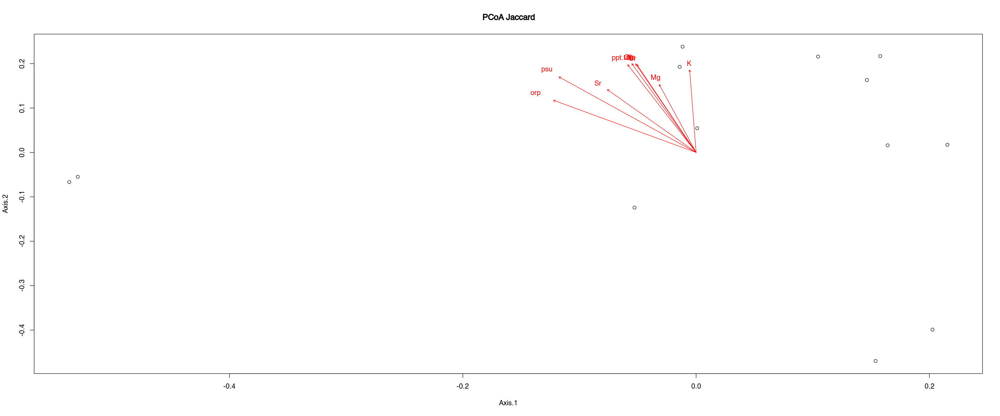

In [195]:
plot(pcoa_prok.v.Wj, main = "PCoA Jaccard")
plot(envf_Wj, p.max = 0.05, col = "red")
env_jW.adj

### Unweighted PCoA Jaccard

In [196]:
prok_pcoa_juw <- ordinate(prok_ndata_no_b,prok_dist_unjac, method = "PCoA")
evals_juw <- prok_pcoa_juw$values$Eigenvalues

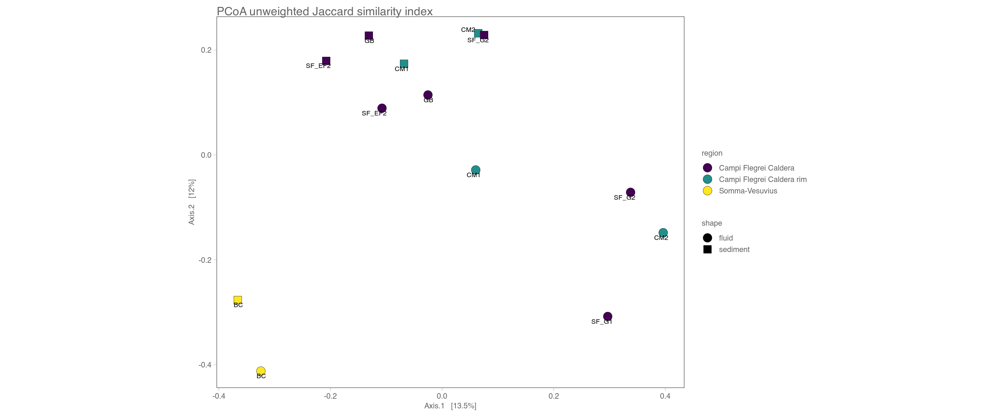

In [197]:
plot_ordination(prok_ndata_no_b, prok_pcoa_juw, type="samples", title="PCoA unweighted Jaccard similarity index") +

        coord_fixed(sqrt(evals_juw[2] / evals_juw[1]))  + 

        geom_point(aes(fill=region,shape=type),size=7,color="black",stroke=0.3) + 

        geom_text_repel(aes(label= code), size=4, hjust=1,vjust=0.4) +

        scale_fill_viridis(discrete=TRUE) + scale_shape_manual(values=c(21:23)) +

        theme_glab() + theme(legend.position = "right") +

        guides(fill = guide_legend(override.aes = list(shape = 21) ),
              shape = guide_legend(override.aes = list(fill = "black")))

# ADONIS

In [67]:
write.csv(data.frame(sample_data(prok_ndata_no_b)),"env_df_adonis_final_2.csv")

In [68]:
env_df_adonis<-read.csv("env_df_adonis_final_2.csv",header=TRUE,sep=",",row.names=1)
env_df_adonis

,code,location,type,region,geo_chem,lat,long,depth,temp,psu,⋯,Mg,Ca,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,CM1,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
16,CM1,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
11,CM2,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
13,CM2,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
17,GB,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
F,GB,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
10,SF_EF2,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302
18,SF_EF2,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302
14,SF_G1,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82306,14.08750,13.3,71.0,34.06,⋯,1096.41,446.81,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868


# ADONIS test on weighted jaccard with region and geochem

In [70]:
#region
adn_w_region <- adonis(prok_dist_wjac~region, 
    data = env_df_adonis, na.action = FALSE, perm = 9999)
adn_w_region

Warning message in adonis(prok_dist_wjac ~ region, data = env_df_adonis, na.action = FALSE, :
“'adonis' is deprecated.
Use 'adonis2' instead.
See help("Deprecated") and help("vegan-deprecated").”


$aov.tab
Permutation: free
Number of permutations: 9999

Terms added sequentially (first to last)

          Df SumsOfSqs MeanSqs F.Model      R2 Pr(>F)  
region     2    1.0915 0.54576  1.2194 0.19606 0.0343 *
Residuals 10    4.4757 0.44757         0.80394         
Total     12    5.5673                 1.00000         
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

$call
adonis(formula = prok_dist_wjac ~ region, data = env_df_adonis, 
    permutations = 9999, na.action = FALSE)

$coefficients
NULL

$coef.sites
                   [,1]        [,2]        [,3]       [,4]        [,5]
(Intercept)  0.86815583  0.88322425  0.88045540  0.8798194  0.92832569
region1      0.08579288  0.08943152  0.07495976  0.0463553 -0.11080273
region2     -0.18863039 -0.18475694 -0.18162234 -0.1610053  0.04837834
                   [,6]        [,7]        [,8]        [,9]       [,10]
(Intercept)  0.92440686  0.90948016  0.91520772  0.94674674  0.89910420
region1     -0.10182200 -0.095739

In [72]:
#geochem 
adn_w_geochem <- adonis(prok_dist_wjac~geo_chem, 
    data = env_df_adonis, na.action = FALSE, perm = 9999)
adn_w_geochem 

Warning message in adonis(prok_dist_wjac ~ geo_chem, data = env_df_adonis, na.action = FALSE, :
“'adonis' is deprecated.
Use 'adonis2' instead.
See help("Deprecated") and help("vegan-deprecated").”


$aov.tab
Permutation: free
Number of permutations: 9999

Terms added sequentially (first to last)

          Df SumsOfSqs MeanSqs F.Model      R2 Pr(>F)  
geo_chem   2    1.0936 0.54679  1.2222 0.19643 0.0311 *
Residuals 10    4.4737 0.44737         0.80357         
Total     12    5.5673                 1.00000         
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

$call
adonis(formula = prok_dist_wjac ~ geo_chem, data = env_df_adonis, 
    permutations = 9999, na.action = FALSE)

$coefficients
NULL

$coef.sites
                  [,1]        [,2]       [,3]        [,4]       [,5]
(Intercept)  0.8990328  0.91383691  0.9089354  0.90163046  0.9077590
geo_chem1   -0.1338153 -0.12618260 -0.1241376 -0.09526135  0.0590840
geo_chem2    0.0618548  0.06146984  0.0459550  0.00242247 -0.1420751
                   [,6]       [,7]        [,8]        [,9]       [,10]
(Intercept)  0.90524251  0.9024634  0.90711951  0.92818619  0.89263604
geo_chem1    0.06190493 -0.1276793 -0.129

# ADONIS test on unweighted jaccard with region and geochem

In [198]:
adn_un_region <- adonis(prok_dist_unjac~region, 
    data = env_df_adonis, na.action = FALSE, perm = 9999)
adn_un_region

Warning message in adonis(prok_dist_unjac ~ region, data = env_df_adonis, na.action = FALSE, :
“'adonis' is deprecated.
Use 'adonis2' instead.
See help("Deprecated") and help("vegan-deprecated").”


$aov.tab
Permutation: free
Number of permutations: 9999

Terms added sequentially (first to last)

          Df SumsOfSqs MeanSqs F.Model     R2 Pr(>F)   
region     2    1.0772 0.53860  1.3444 0.2119 0.0053 **
Residuals 10    4.0064 0.40064         0.7881          
Total     12    5.0836                 1.0000          
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

$call
adonis(formula = prok_dist_unjac ~ region, data = env_df_adonis, 
    permutations = 9999, na.action = FALSE)

$coefficients
NULL

$coef.sites
                   [,1]        [,2]        [,3]        [,4]       [,5]
(Intercept)  0.81876010  0.82306497  0.84358208  0.85049051  0.8958361
region1      0.08629237  0.08549218  0.07187734  0.05729676 -0.1092854
region2     -0.18175472 -0.18272200 -0.17935298 -0.17487855  0.0409969
                   [,6]        [,7]        [,8]        [,9]       [,10]
(Intercept)  0.88791516  0.86734354  0.85943724  0.91857198  0.87483683
region1     -0.09576135 -0.09397

In [199]:
adn_un_geochem <- adonis(prok_dist_unjac~geo_chem, 
    data = env_df_adonis, na.action = FALSE, perm = 9999)
adn_un_geochem

Warning message in adonis(prok_dist_unjac ~ geo_chem, data = env_df_adonis, na.action = FALSE, :
“'adonis' is deprecated.
Use 'adonis2' instead.
See help("Deprecated") and help("vegan-deprecated").”


$aov.tab
Permutation: free
Number of permutations: 9999

Terms added sequentially (first to last)

          Df SumsOfSqs MeanSqs F.Model     R2 Pr(>F)   
geo_chem   2    1.0874 0.54368  1.3605 0.2139 0.0036 **
Residuals 10    3.9962 0.39962         0.7861          
Total     12    5.0836                 1.0000          
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

$call
adonis(formula = prok_dist_unjac ~ geo_chem, data = env_df_adonis, 
    permutations = 9999, na.action = FALSE)

$coefficients
NULL

$coef.sites
                   [,1]        [,2]        [,3]        [,4]        [,5]
(Intercept)  0.84914990  0.85327282  0.87172260  0.87568397  0.87649711
geo_chem1   -0.13189725 -0.12961924 -0.12714070 -0.11362317  0.04985656
geo_chem2    0.06682469  0.06259727  0.04780557  0.02123483 -0.13748406
                   [,6]        [,7]        [,8]       [,9]       [,10]
(Intercept)  0.87056987  0.86124853  0.85348556  0.9025626  0.86475976
geo_chem1    0.05033825 -0.1

## Plot the map figure

In [219]:
library("ggnewscale")
library("scico")
library("marmap")

Registered S3 methods overwritten by 'adehabitatMA':
  method                       from
  print.SpatialPixelsDataFrame sp  
  print.SpatialPixels          sp  


Attaching package: ‘marmap’


The following object is masked from ‘package:grDevices’:

    as.raster




File already exists ; loading 'marmap_coord_13.8;40.5;14.6;40.9_res_0.25.csv'



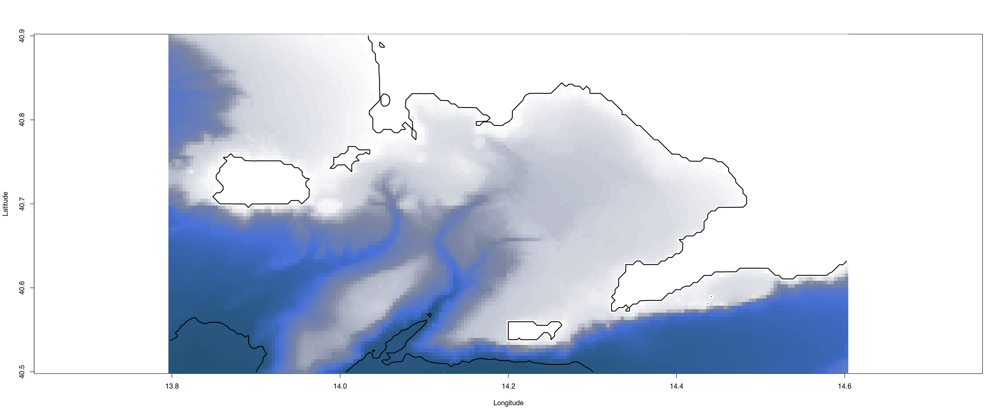

In [227]:
getNOAA.bathy(lon1=13.8,lon2=14.6,lat1=40.5,lat2=40.9, res = 0.000001, keep = TRUE) -> a
plot(a, image=TRUE, deep=-6000, shallow=0, step=1000, lwd=2)

In [221]:
lit_points <- read.csv("geological map/feamp20_literature.csv",header=T, sep=",")
points <- as.data.frame(unique(lit_points))

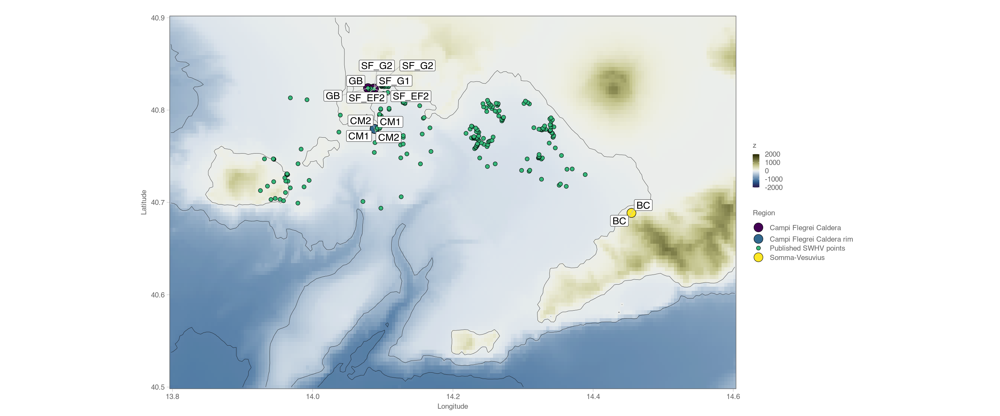

In [228]:
ggplot(a, aes(x=x, y=y)) +
  coord_quickmap() +
  geom_raster(aes(fill=z)) +
  scale_fill_scico(palette = "broc", limits = c(-2000, 2000)) +

  geom_contour(aes(z=z),
               breaks=c(0, -500, -1000, -2000, -10000), colour="grey3", size=0.2) +
  scale_x_continuous(expand=c(0,0)) +
  scale_y_continuous(expand=c(0,0)) +

  new_scale_fill() +
  geom_point(data = sample_data(prok_ndata_no_b), aes(y=lat, x=long, fill=region), shape = 21, size = 7) +
  guides(color = guide_legend(override.aes = list(size = 8))) +
  scale_fill_viridis(discrete=TRUE) +

  geom_point(data = points, aes(y=lat, x=long, fill="Published SWHV points"), shape = 21, size =3) +

  geom_label_repel(data = sample_data(prok_ndata_no_b), size = 6, segment.color ="grey",
               aes(x = long, y = lat, label = code), max.overlaps = 30) +

  labs(title = "",
       fill = "Region",
       x = "Longitude",
       y = "Latitude",
       z="Elevation (m)") +

theme_glab(base_size = 19)

 ## Supplementary figure 1 -Inspecting the covariance among the envioronmental variables

In [200]:
library(corrplot)
library(RColorBrewer)
library(magrittr)

In [210]:
env_pca<-read.csv("env_df_adonis_final_2.csv",header=TRUE,sep=",",row.names=1)
env_pca

,code,location,type,region,geo_chem,lat,long,depth,temp,psu,⋯,Mg,Ca,Mn,Fe,Zn,As,Rb,Sr,Mo,Cs
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,CM1,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
16,CM1,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,7.0,26.3,27.54,⋯,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
11,CM2,Gulf of Naples,sediment,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
13,CM2,Gulf of Naples,fluid,Campi Flegrei Caldera rim,Cluster_1,40.77955,14.08835,8.3,27.0,38.37,⋯,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
17,GB,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
F,GB,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_2,40.82375,14.07890,5.4,28.0,35.41,⋯,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
10,SF_EF2,Gulf of Naples,sediment,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302
18,SF_EF2,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_1,40.82306,14.08750,10.0,34.0,26.50,⋯,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302
14,SF_G1,Gulf of Naples,fluid,Campi Flegrei Caldera,Cluster_2,40.82306,14.08750,13.3,71.0,34.06,⋯,1096.41,446.81,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868


In [211]:
env_pca <- env_pca[6:32]
summary(env_pca)

      lat             long           depth             temp      
 Min.   :40.69   Min.   :14.08   Min.   : 0.200   Min.   :26.30  
 1st Qu.:40.78   1st Qu.:14.09   1st Qu.: 5.400   1st Qu.:26.40  
 Median :40.82   Median :14.09   Median : 8.300   Median :28.00  
 Mean   :40.79   Mean   :14.14   Mean   : 7.762   Mean   :37.86  
 3rd Qu.:40.82   3rd Qu.:14.09   3rd Qu.:10.000   3rd Qu.:34.00  
 Max.   :40.82   Max.   :14.45   Max.   :13.300   Max.   :71.00  
                                                                 
      psu              do             orp               ph       
 Min.   :17.65   Min.   :43.00   Min.   :-226.2   Min.   :5.250  
 1st Qu.:26.50   1st Qu.:51.80   1st Qu.:-173.0   1st Qu.:5.330  
 Median :34.06   Median :53.70   Median :-145.2   Median :5.610  
 Mean   :30.31   Mean   :60.91   Mean   :-127.2   Mean   :5.752  
 3rd Qu.:35.41   3rd Qu.:75.00   3rd Qu.:-115.4   3rd Qu.:6.300  
 Max.   :38.37   Max.   :92.00   Max.   :  54.2   Max.   :6.300  
          

In [215]:
env_pca <- env_pca %>%
  select_if(~ !any(is.na(.)))

In [212]:
library(corrplot)

In [216]:
cor_env<-cor(env_pca)

In [217]:
svg(file = "Supplementary_figure_1.svg")

corrplot(cor_env, type = 'lower', order = 'hclust', tl.col = 'black',
         cl.ratio = 0.1, tl.srt = 45, col = c('#B35806','#E08214','#FDB863',
                                              '#FEE0B6','#D8DAEB','#B2ABD2',
                                              '#8073AC','#542788'))

dev.off()

png 
  2

# FEAMP20 Geochemistry analysis

## Principal Component Analysis (PCA) of the geochemistry of the shallow water hydrothermal vents of the Gulf of Naples

In [5]:
library(dplyr)
library("AMR")
library(factoextra)

feamp20 <- read.csv("FEAMP_Geochemistry.csv", header=T,sep=",", row.names=1)
feamp20 <- feamp20 %>% select_if(~ !any(is.na(.)))
feamp20

Loading required package: ggplot2

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa



,code,temp,pH,Cl,Br,SO4,Na,K,Mg,Ca,Mn,Fe,zn,As,Rb,Sr,Mo,Cs
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SF201023_G_F,SF201023_G_F,68.9,5.61,19033.28,64.18,2057.21,11198.62,408.11,965.32,498.51,1.131211,3.361098,0.047900,2.446793,2.424394,13.074010,0.002394,1.645036
CM201023_F,CM201023_F,27.0,6.30,20846.61,72.06,2868.06,12130.20,389.49,1366.48,437.72,0.003700,0.011037,0.033080,0.020202,0.147709,10.231950,0.011593,0.005425
SF200622_G_F,SF200622_G_F,71.0,5.54,18952.08,64.86,2316.92,11110.85,380.81,1096.41,446.81,1.183603,3.590772,0.186116,1.908748,2.430386,13.262330,0.001486,1.729868
BC200904_F,BC200904_F,26.4,6.30,10030.06,34.27,1377.55,5817.65,195.81,606.87,460.67,0.047346,0.097862,0.193533,0.011163,0.120608,8.110929,0.000000,0.006474
CM200723_F,CM200723_F,26.3,5.87,21094.04,72.48,2909.92,12303.49,397.03,1395.49,465.66,0.061217,0.113124,0.456657,0.021972,0.157602,11.402800,0.010804,0.002033
GB200622_F,GB200622_F,28.0,5.33,19842.83,68.07,2206.67,11722.55,597.37,1026.25,482.27,3.099014,11.123430,0.170947,0.512667,3.237141,11.487620,0.000985,0.170143
SF201023_EF_F,SF201023_EF_F,34.0,5.25,20741.32,72.20,2920.13,12304.44,403.69,1383.79,436.77,0.007141,0.033976,0.023478,0.010740,0.145538,10.712230,0.011988,0.004302


[1] 0.3850311
[1] 0.3553896
[1] 0.1415814
[1] 0.06391494
[1] 0.03115327
[1] 0.02292961
[1] 3.319869e-17
[1] 2.346211e-17
[1] 8.874064e-18
[1] 7.118351e-18
[1] 5.579579e-18
[1] 3.911081e-18
[1] -2.133393e-18
[1] -2.476131e-18
[1] -9.274453e-18
[1] -1.94332e-17
[1] -3.75385e-17


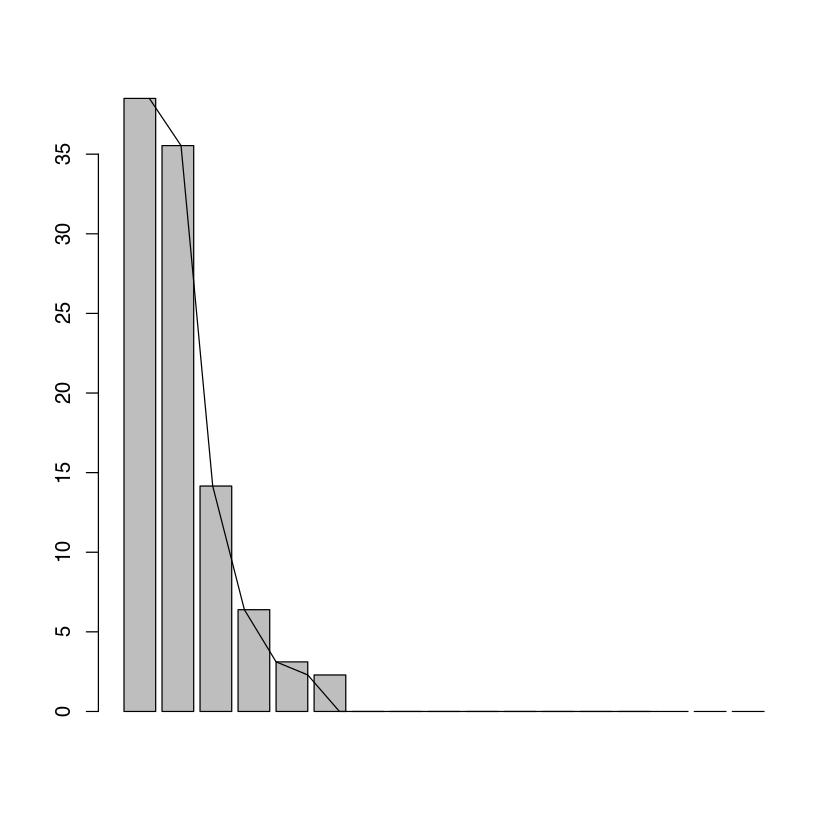

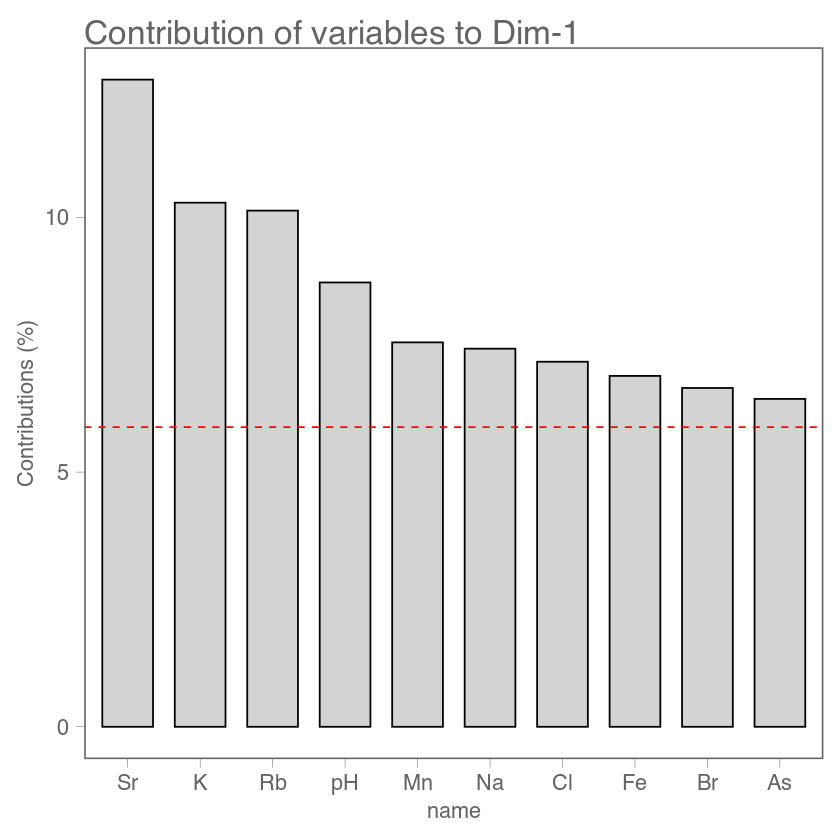

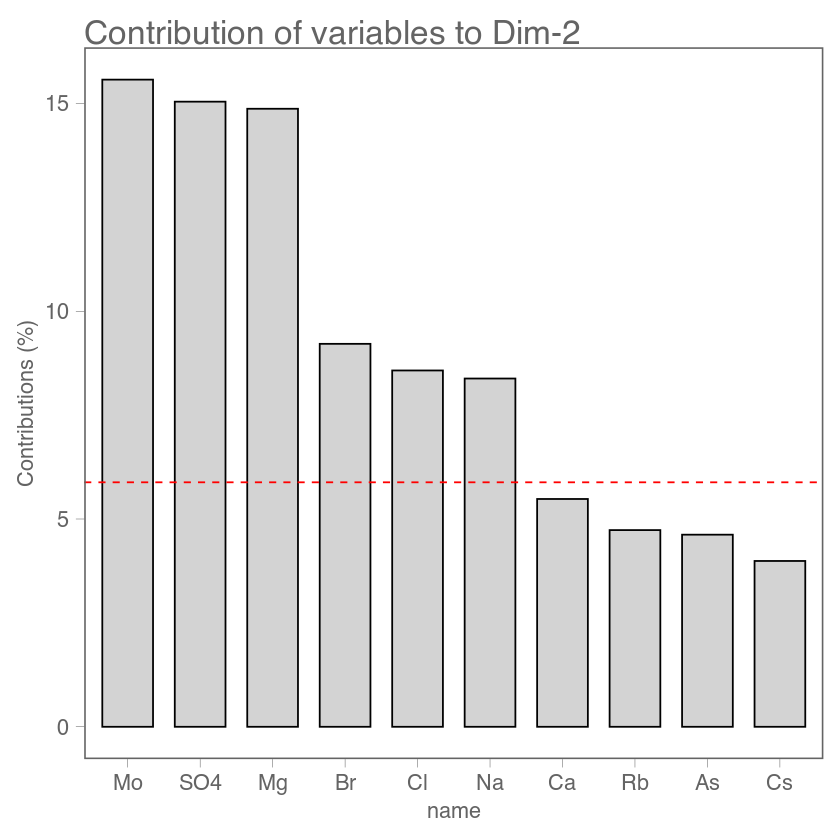

In [9]:
cor_trace<-cor(feamp20[,2:18])


r.eigen_geoch <- eigen(cor_trace)


for (r in r.eigen_geoch$values) {
  print(r / sum(r.eigen_geoch$values))
}

barplot((r.eigen_geoch$values/ sum(r.eigen_geoch$values))*100)
lines((r.eigen_geoch$values/ sum(r.eigen_geoch$values))*100)

data.pca_trace <- prcomp(feamp20[,2:18], scale=TRUE)

fviz_contrib(data.pca_trace, choice = "var", axes = 1, top = 10, fill = "lightgray",  color = "black") +theme_glab()

fviz_contrib(data.pca_trace, choice = "var", axes = 2, top = 10, fill = "lightgray",  color = "black") +theme_glab()

In [10]:
pca_df1<-(fviz_pca_biplot(data.pca_trace, repel = TRUE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
                ))$data[,1:3]

pca_df2<-cbind(pca_df1,feamp20[,c(1)])
colnames(pca_df2)[2]<-c("PC1")
colnames(pca_df2)[3]<-c("PC2")
head(pca_df2)

,name,PC1,PC2,"feamp20[, c(1)]"
,<fct>,<dbl>,<dbl>,<chr>
SF201023_G_F,SF201023_G_F,-2.2347620,-2.122595,SF201023_G_F
CM201023_F,CM201023_F,1.1952231,2.541425,CM201023_F
SF200622_G_F,SF200622_G_F,-1.8988985,-1.260580,SF200622_G_F
BC200904_F,BC200904_F,4.7404633,-3.117762,BC200904_F
CM200723_F,CM200723_F,0.5046005,2.391048,CM200723_F
GB200622_F,GB200622_F,-2.5421551,-1.090447,GB200622_F


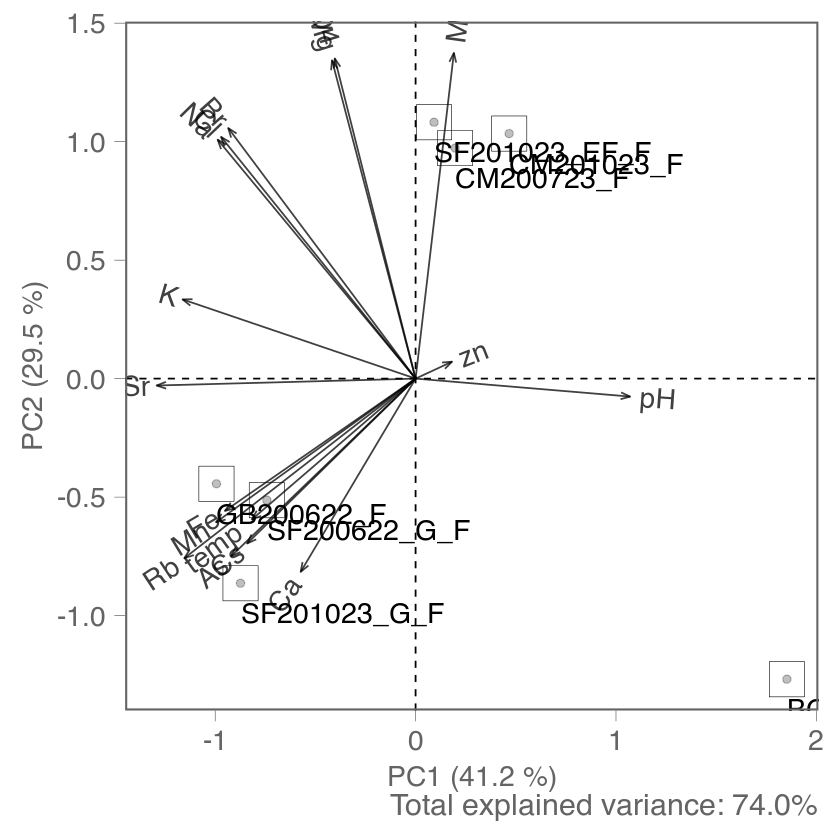

In [11]:
A <- ggplot_pca(data.pca_trace, 
           scale = 1,
           pc.biplot = TRUE,
           arrows_colour = "black",
           arrows_textsize = 6,
           arrows_textangled=TRUE,
           base_textsize = 26) +
  
  geom_point(aes(fill = pca_df2$region),
             shape = 22,
             size = 11,
             color = "black",
             stroke = 0.25) +
  
  labs(x = "PC1 (41.2 %)",
       y = "PC2 (29.5 %)") +
  
  scale_fill_manual(values = c("#3a5291e2", "#006c00a5", "#ecae66f6")) +
  
  geom_text(aes(label =pca_df2$name), size = 6, hjust = 0, vjust = 2, check_overlap = FALSE) +
  
  geom_vline(xintercept = 0, linetype = "dashed", color = "black") + 
  geom_hline(yintercept = 0, linetype = "dashed", color = "black") +
  
  theme_bw() + theme_glab(base_size = 26)

print(A)

## Biplots of the different elements measured

In [19]:
options(repr.plot.width=12, repr.plot.height=8)

In [15]:
feamp20_biplots <- read.csv("FEAMP20_Geochemistry_2.csv", header=T,sep=",", row.names=1)
feamp20_biplots

,id,type,region,Cl,Br,SO4,Na,K,Mg,Ca,Mn,Fe,Rb,Cs
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SF_G2,SF_G2,sample,Campi Flegrei Caldera,19033.28,64.18,2057.21,11198.62,408.11,965.32,498.51,1.1312110,3.361098,2.424394,1.6450360
GB,GB,sample,Campi Flegrei Caldera,19842.83,68.07,2206.67,11722.55,597.37,1026.25,482.27,3.0990140,11.123430,3.237141,0.1701430
CM1,CM1,sample,Campi Flegrei Caldera rim,21094.04,72.48,2909.92,12303.49,397.03,1395.49,465.66,0.0612170,0.113124,0.157602,0.0020330
BC,BC,sample,Somma-Vesuvius,10030.06,34.27,1377.55,5817.65,195.81,606.87,460.67,0.0473460,0.097862,0.120608,0.0064740
SF_G1,SF_G1,sample,Campi Flegrei Caldera,18952.08,64.86,2316.92,11110.85,380.81,1096.41,446.81,1.1836030,3.590772,2.430386,1.7298680
SW,SW,Seawater,Seawater,21910.00,75.11,3160.40,12581.00,430.00,1417.00,444.90,0.0003021,0.000940,0.145300,0.0002658
CM2,CM2,sample,Campi Flegrei Caldera rim,20846.61,72.06,2868.06,12130.20,389.49,1366.48,437.72,0.0037000,0.011037,0.147709,0.0054250
SF_EF2,SF_EF2,sample,Campi Flegrei Caldera,20741.32,72.20,2920.13,12304.44,403.69,1383.79,436.77,0.0071410,0.033976,0.145538,0.0043020


## SO4-Mg

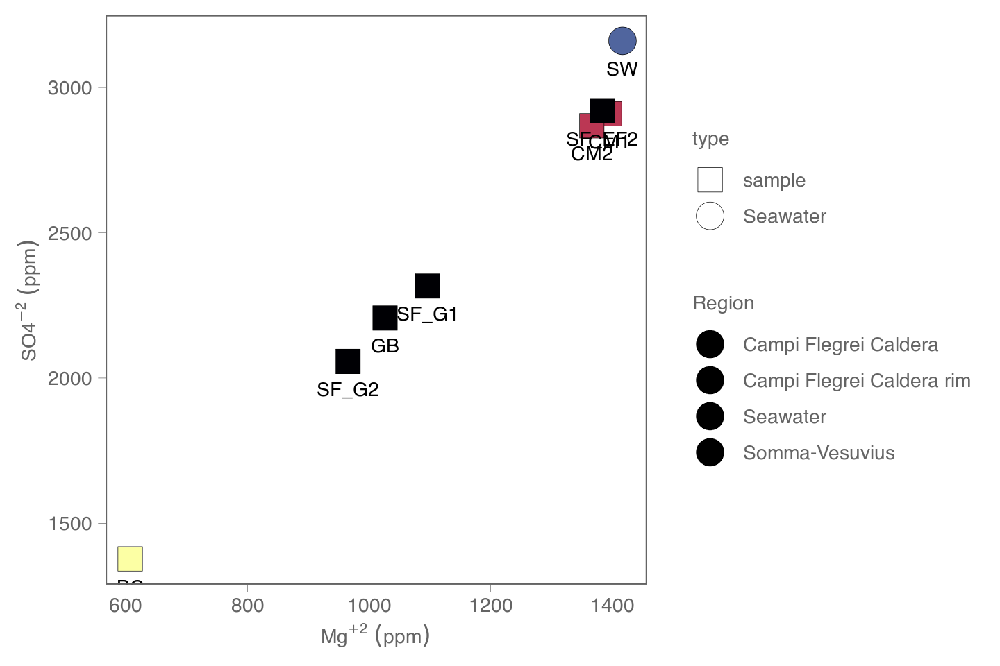

In [20]:
B <- ggplot(feamp20_biplots, aes(x=Mg, y=SO4)) + 

     geom_point(aes(fill=region, shape=type), size=11,color="black", stroke=0.3) + theme_glab() +

    scale_alpha_manual(values = c(0.4,0.9, 0.9),labels = c("sample", "end member", "seawater")) +

    theme(legend.position = "right")   +

    #scale_shape_manual(values = rep(21, len = 7)) 

    scale_shape_manual(values = c(22,21)) + 

    geom_text(label=feamp20_biplots$id, size=6,  hjust=0.5, vjust=2.5) +

    scale_fill_manual(values = c("#000004ff", "#bb3754ff","#3a5291e2", "#fcffa4ff")) +

    labs(y=expression(SO4^-2*~(ppm)),
     x=expression(Mg^+2*~(ppm)),
     fill="Region"
    ) +
theme_glab(base_size = 26)

B

## Cl-Mg

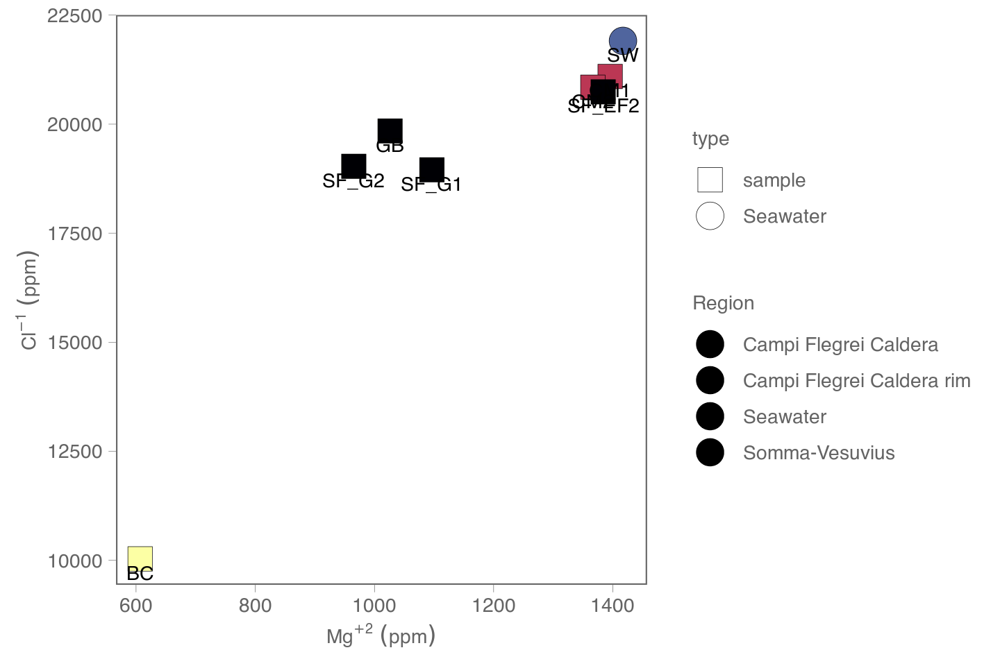

In [22]:
C <- ggplot(feamp20_biplots, aes(x=Mg, y=Cl)) + 

    geom_point(aes(fill=region, shape=type), size=11,color="black", stroke=0.3) + theme_glab() +

    scale_alpha_manual(values = c(0.4,0.9, 0.9),labels = c("sample", "end member", "seawater")) +

    theme(legend.position = "right")   +

    #scale_shape_manual(values = rep(21, len = 7)) 

    scale_shape_manual(values = c(22,21)) + 

    geom_text(label=feamp20_biplots$id, size=6,  hjust=0.5, vjust=1.5) +

    scale_fill_manual(values = c("#000004ff", "#bb3754ff","#3a5291e2", "#fcffa4ff")) +

    labs(y=expression(Cl^-1*~(ppm)),
     x=expression(Mg^+2*~(ppm)),
     fill="Region"
    ) +
theme_glab(base_size = 26)

C

#ggsave("Cl_mg.svg", width=12, height=8)

## Br-Cl

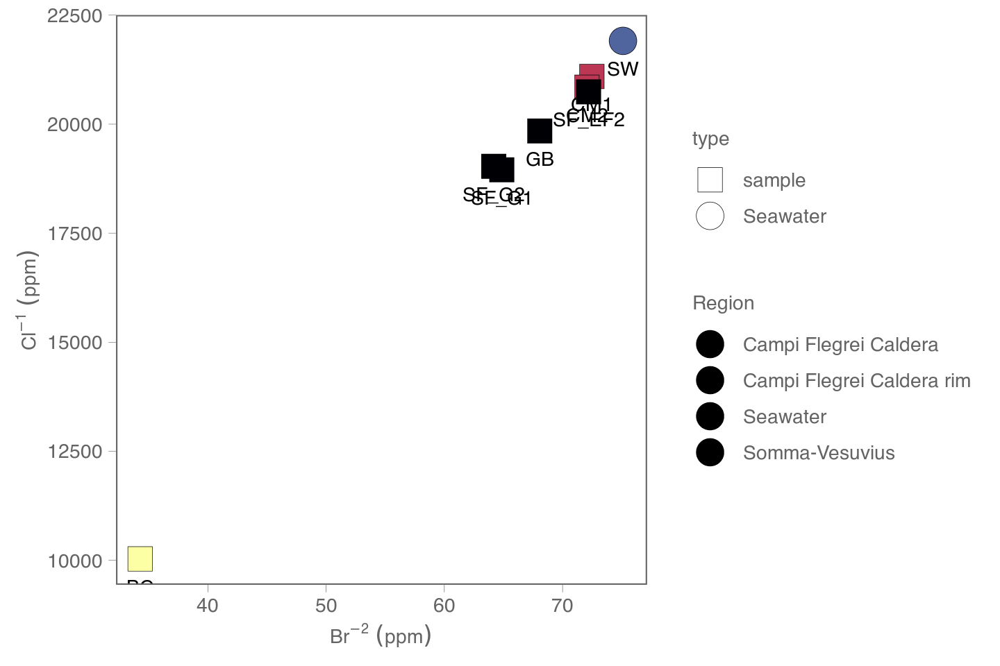

In [23]:
D <- ggplot(feamp20_biplots, aes(x=Br, y=Cl)) + 

    geom_point(aes(fill=region, shape=type), size=11,color="black", stroke=0.3) + theme_glab() +

    scale_alpha_manual(values = c(0.4,0.9, 0.9),labels = c("sample", "end member", "seawater")) +

    theme(legend.position = "right")   +

    #scale_shape_manual(values = rep(21, len = 7)) 

    scale_shape_manual(values = c(22,21)) + 

    geom_text(label=feamp20_biplots$id, size=6,  hjust=0.5, vjust=2.5) +

    scale_fill_manual(values = c("#000004ff", "#bb3754ff","#3a5291e2", "#fcffa4ff")) +

    labs(y=expression(Cl^-1*~(ppm)),
     x=expression(Br^-2*~(ppm)),
     fill="Region"
    ) +
theme_glab(base_size = 26)

D

#ggsave("Br_cl.svg", width=12, height=8)

## NA-Cl

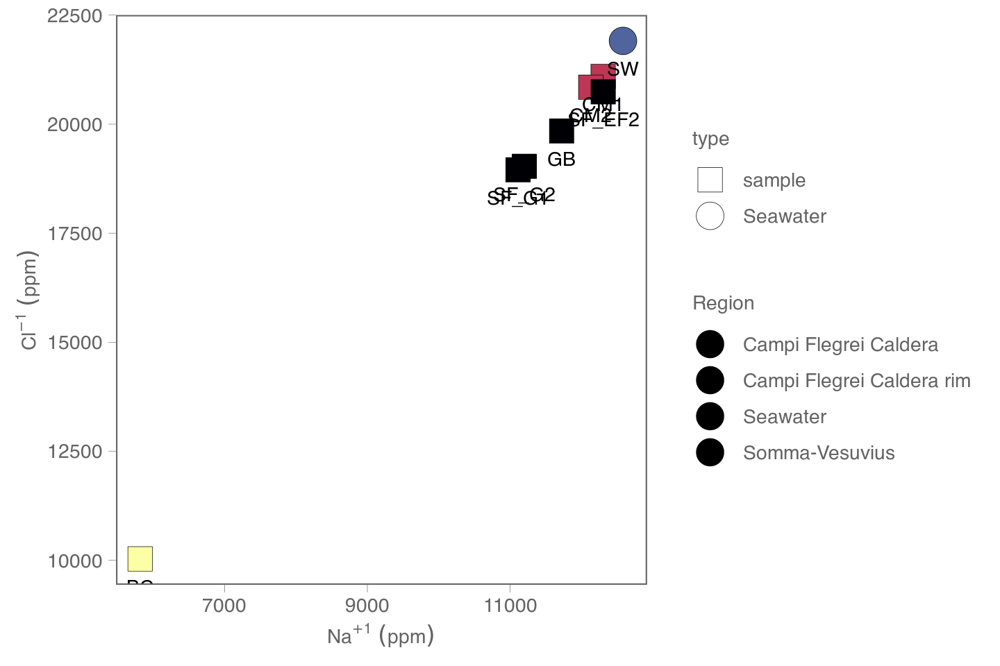

In [24]:
E <-ggplot(feamp20_biplots, aes(x=Na, y=Cl)) + 

    geom_point(aes(fill=region, shape=type), size=11,color="black", stroke=0.3) + theme_glab() +

    scale_alpha_manual(values = c(0.4,0.9, 0.9),labels = c("sample", "end member", "seawater")) +

    theme(legend.position = "right")   +

    #scale_shape_manual(values = rep(21, len = 7)) 

    scale_shape_manual(values = c(22,21)) +

    geom_text(label=feamp20_biplots$id, size=6,  hjust=0.5, vjust=2.5) +

    scale_fill_manual(values = c("#000004ff", "#bb3754ff","#3a5291e2", "#fcffa4ff")) +

    labs(y=expression(Cl^-1*~(ppm)),
     x=expression(Na^+1*~(ppm)),
     fill="Region"
    ) +
theme_glab(base_size = 26)

E

#ggsave("Na_cl.svg", width=12, height=8)

## Fe vs Mg

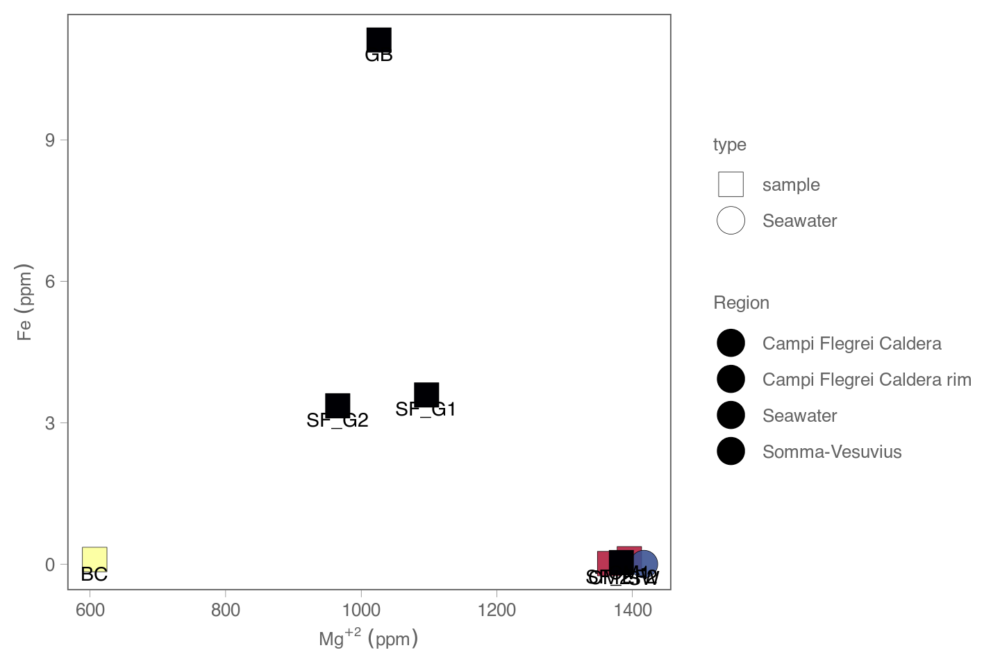

In [26]:
F <- ggplot(feamp20_biplots, aes(x=Mg, y=Fe)) + 

    geom_point(aes(fill=region, shape=type), size=11,color="black", stroke=0.3) + theme_glab() +

    scale_alpha_manual(values = c(0.4,0.9, 0.9),labels = c("sample", "end member", "seawater")) +

    theme(legend.position = "right")   +

    #scale_shape_manual(values = rep(21, len = 7)) 

    scale_shape_manual(values = c(22,21)) + 

    geom_text(label=feamp20_biplots$id, size=6,  hjust=0.5, vjust=1.5) +

    scale_fill_manual(values = c("#000004ff", "#bb3754ff","#3a5291e2", "#fcffa4ff")) +

    labs(y=expression(Fe~(ppm)),
     x=expression(Mg^+2*~(ppm)),
     fill="Region"
    ) +
theme_glab(base_size = 24)

F

#ggsave("Fe_Mg.svg", width=12, height=8)

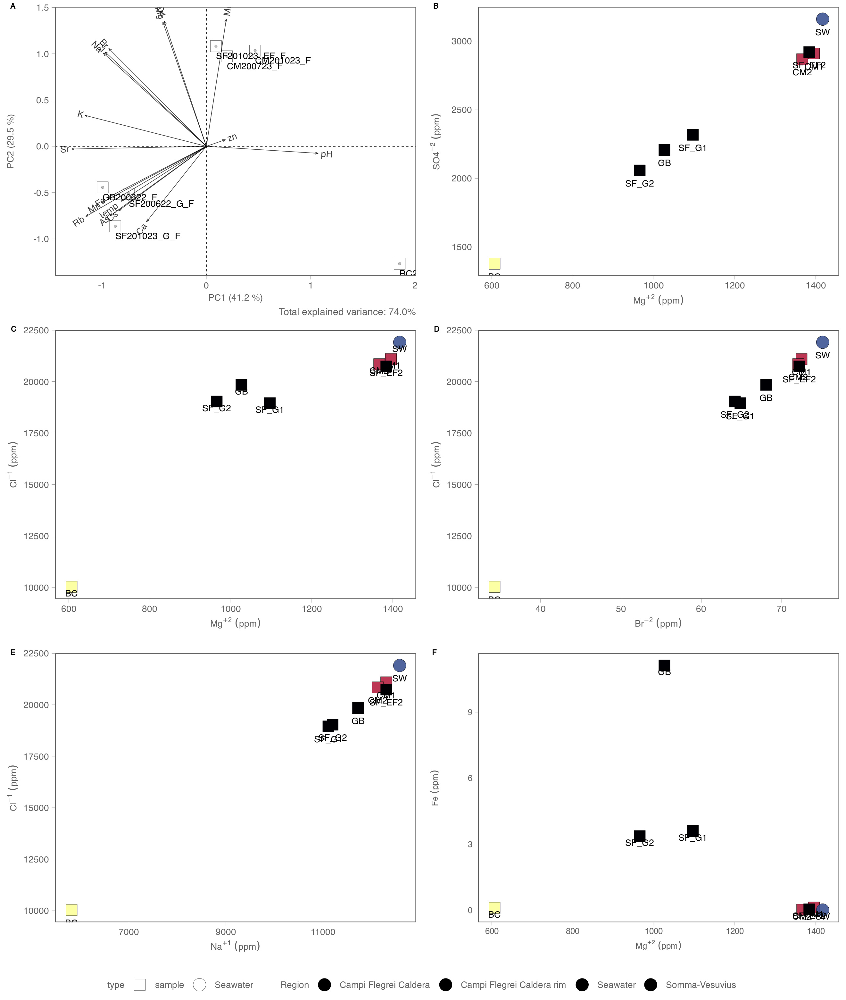

In [28]:
library(ggpubr)

options(repr.plot.width=22, repr.plot.height=26)

ggarrange(A, B, #substitute individual plot names
          C, D,
          E, F, 
          labels=c("A", "B", "C", "D", "E", "F"), hjust=-2, 
          nrow=3,
          ncol=2,
          common.legend = TRUE,
          widths=8,
          heights=8,
          align="hv",
          legend = "bottom"
          )

In [ ]:
#ggsave("geochem_arranged_final.svg", width=22, height=26)

## SAVE THE DATA

In [29]:
save.image("FEAMP20_16SrRNA_analysis.Rdata")

In [8]:
load("FEAMP20_16SrRNA_analysis.Rdata")